# Raytracing tests
Trying with Python and Pytorch

Sources:
- https://raytracing.github.io/
- https://github.com/programacaodinamica/raytracing
- https://www.scratchapixel.com/lessons/3d-basic-rendering/ray-tracing-rendering-a-triangle/ray-triangle-intersection-geometric-solution#:~:text=The%20ray%20can%20intersect%20the,these%20two%20vectors%20is%200).

In [1]:
#raytracing pytorch
#imports
import torch
import torchvision
import torchvision.transforms as T
from PIL import Image
import time

#fx to use the GPU, if available
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

device=get_default_device()
print(f"Running on device: {device}")

default_type=torch.float32
print(f"Precision: {default_type}")

Running on device: cuda
Precision: torch.float32


### Let first show an image

Scene 0: just displaying image


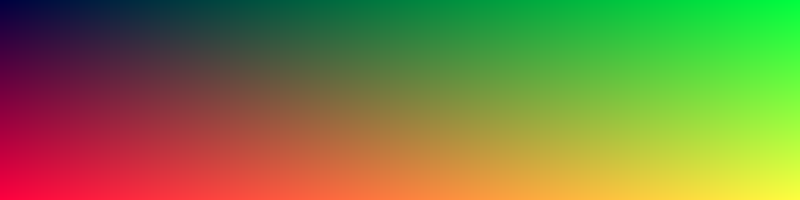

In [2]:
def showImg(tensor):
    transform = T.ToPILImage()
    img = transform(tensor)
    display(img)


def test_img(h=200,w=800):
    tensor=torch.zeros(3,h,w,device=device,dtype=default_type)
    for i in range(h):
        for j in range(w):
            tensor[0,i,j]=i/h
            tensor[1,i,j]=j/w
            tensor[2,i,j]=0.25
    showImg(tensor)

print('Scene 0: just displaying image')
test_img() 


### Lets define vector operation using torch

In [3]:
#defining a 3 dimentional vector 
def vec3(values=[0,0,0]):
    if len(values)!=3:
        raise("len of values must be 3")
    return torch.tensor(values,device=device,dtype=default_type)

#vector functions
def dot(t1,t2):
    return torch.dot(t1,t2)
def norm(t):
    return torch.norm(t)    
def unit_vector(t):
    return t/torch.norm(t)
def square_norm(t):
    return norm(t)**2

#defining a ray in a class
class Ray:
    def __init__(self,origin,dir):
        #TODO check type?
        self.dir = unit_vector(dir)
        self.origin = origin
    def at(self,t):
        return self.origin+t*self.dir

#testing a ray
ray=Ray(vec3(),vec3([0,0,3]))
ray.at(2.0)





tensor([0., 0., 2.], device='cuda:0')

### Tracing rays, and reaching the background. And cast the background color.



Scene 1, raytracing the background (800x1422)


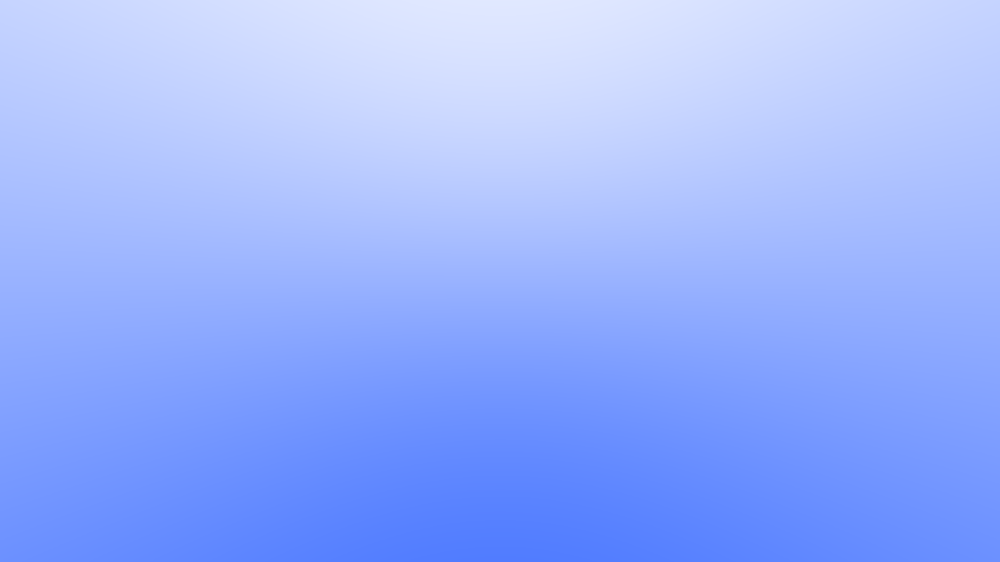

In [4]:
#define the image settings
aspect_ratio=16/9
h=800
w=int(aspect_ratio*h)
image = torch.zeros(3,h,w)

#camera viewport
viewport_h=2.0
viewport_w=viewport_h*aspect_ratio
focal_len=1.0
X=vec3([viewport_w,0,0])
Y=vec3([0,viewport_h,0])
Z=vec3([0,0,focal_len])

origin=vec3()
lower_left=origin - X/2 -Y/2 +Z

#define the bg color, based on ray
def bg_color(ray):
    t=(ray.dir[1]+1)/2
    C1=vec3([1,1,1])
    C2=vec3([0.2,0.4,1])
    return (1-t)*C1+t*C2

#cast a ray for each pixel
print(f"Scene 1, raytracing the background ({h}x{w})")
for i in range(h):
    for j in range(w):
        u=i/h
        v=j/w
        dir = lower_left +v*X+u*Y - origin
        ray =Ray(origin,dir)

        color = bg_color(ray)
        image[:,i,j]=color

showImg(image)     

Scene 2, with sphere. (800x1422)


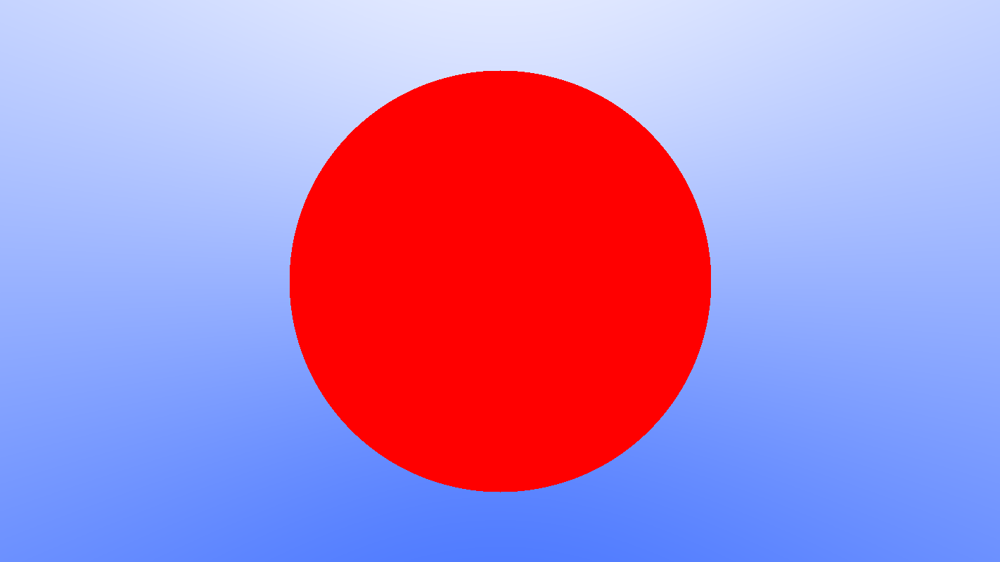

In [5]:
#lets make a sphere
#default color is red
class Sphere:
    def __init__(self,center,radius, color=vec3([1,0,0])):
        self.center=center
        self.radius=radius
        self.color=color

#check if a ray hit the sphere
def hit_sphere(sphere, ray):
    a=square_norm(ray.dir)
    oc=sphere.center-ray.origin
    b=2*dot(ray.dir, oc)
    c=square_norm(oc)-sphere.radius**2
    d=b*b-4*a*c
    if d<0: #no  solutions to the equation that finds where the ray meets the sphere surface
        return False
    else:
        return True

#define the scene color, based on the rays 
#if hit the sphere, cast sphere color
#otherwise, cast the background color
def scene2_color(ray, sphere):
    if hit_sphere(sphere,ray):
        return sphere.color
    else:
        return bg_color(ray)

#create sphere object
sphere=Sphere(vec3([0,0,5]),3)

print(f"Scene 2, with sphere. ({h}x{w})")
for i in range(h):
    for j in range(w):
        u=i/h
        v=j/w
        dir = lower_left +v*X+u*Y - origin
        ray = ray=Ray(origin,dir)

        color = scene2_color(ray,sphere)
        image[:,i,j]=color

showImg(image)     

### Now, lets add diferent colors to different touch points

Scene 3, adding normals (800x1422)


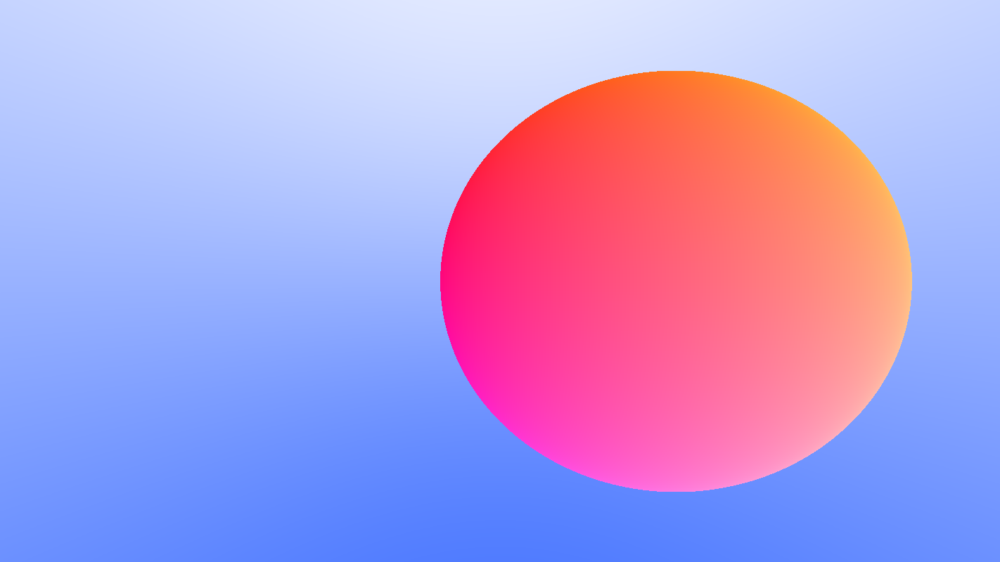

In [6]:
#in the sphere, we add a method to detect where in the ray it touches the sphere.
#and also the normal vector            
class Sphere:
    def __init__(self,center,radius, color=vec3([1,0,0])):
        self.center=center
        self.radius=radius
        self.color=color
    def hit_at(self,ray):
        a=square_norm(ray.dir)
        oc=ray.origin-self.center
        b=2*dot(ray.dir, oc)
        c=square_norm(oc)-self.radius**2
        d=b*b-4*a*c
        if d<=0:
            return -1.0
        else:
            return (-b-torch.sqrt(d))/(2*a)
    def normal(self,ray):
        t=self.hit_at(ray)
        if t==-1:
            return vec3()
        else:
            hit_point= ray.at(t)
            return unit_vector(hit_point-self.center)

#lets keep the red channel color of the sphere
#and green and blue channels to the the normal
def scene3_color(ray, sphere):
    normal=sphere.normal(ray)
    if not torch.equal(normal, vec3()):
        normal=(normal+1)/2
        g_channel=normal[0]
        b_channel=normal[1]
        color=sphere.color
        color[1]=g_channel
        color[2]=b_channel
        return color
    else:
        return bg_color(ray)

sphere=Sphere(vec3([2,0,5]),3)

print(f"Scene 3, adding normals ({h}x{w})")
for i in range(h):
    for j in range(w):
        u=i/h
        v=j/w
        dir = lower_left +v*X+u*Y - origin
        ray = ray=Ray(origin,dir)

        color = scene3_color(ray,sphere)
        image[:,i,j]=color

showImg(image)     

### Now, lets make a list of spheres.

Scene 4, adding more objects (800x1422)


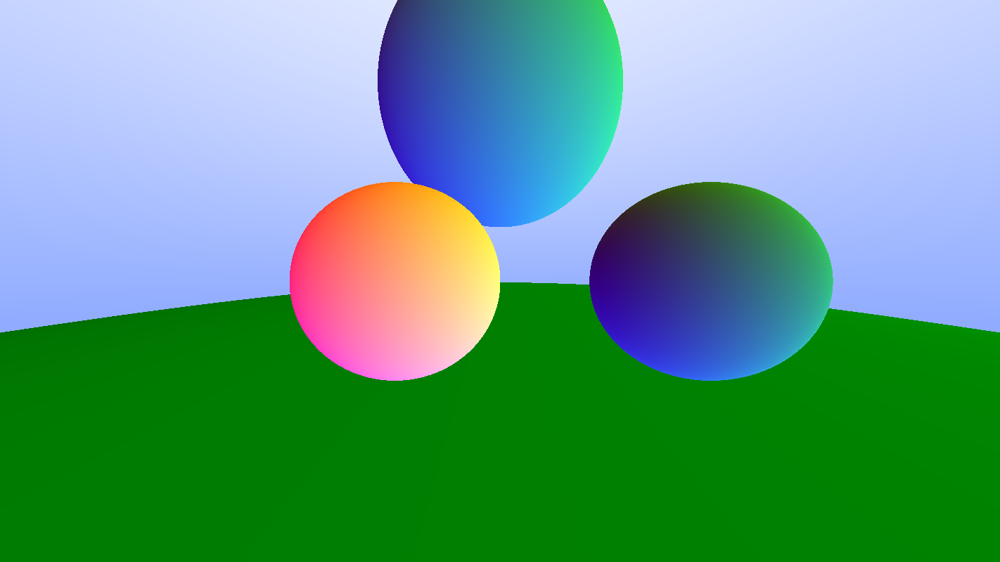

In [7]:
from abc import ABC, abstractmethod
#abstract class for a surface
class Surface(ABC):
    def hit(self,ray, max_t, min_t, record):
        pass

#hit class. It records the point where the ray hit, the t and the normal
class Hit:
    def __init__(self,point=vec3(),t=0.0,normal=vec3()):
        self.point=point
        self.t=t
        self.normal=normal
        #self.hit= not (torch.equal(self.point,zero) and t==0.0 and torch.equal(self.normal,zero))
        #setting the normal 
    def set_face_normal(self,ray,outnormal):
        front_face=dot(ray.dir,outnormal)
        self.normal = outnormal if front_face else -outnormal
    def no_hit(self):
        if torch.equal(self.point,vec3()) and self.t==0.0 and torch.equal(self.normal,vec3()):
            return True
        return False
        #front face?

#update sphere class to return the hit of the ray
class Sphere(Surface):
    def __init__(self,center,radius, color=vec3([1,0,0])):
        self.center=center
        self.radius=radius
        self.color=color
    def hit(self,ray, t_range=(0,float("inf"))):
        a=square_norm(ray.dir)
        oc=ray.origin-self.center
        b=2*dot(ray.dir, oc)
        c=square_norm(oc)-self.radius**2
        d=b*b-4*a*c
        if d<=0:
            return(Hit(),None)
        
        root=(-b-torch.sqrt(d))/(2*a)        
        if not (t_range[0]< root <t_range[1]):
            root=(-b+torch.sqrt(d))/(2*a)
            if not (t_range[0]< root <t_range[1]):
                return(Hit(),None)

        normal=unit_vector(ray.at(root)-self.center)
        hitpoint=Hit(point=ray.at(root), t=root, normal = normal)
        hitpoint.set_face_normal(ray,normal)
        return (hitpoint,self)


#and this class stores a list of surfaces. calculate the hit point of the closes to screen
class SurfaceList(Surface):
    def __init__(self,first=None):
        self.surfaces=[]
        if first is not None:
            self.surfaces=[first]
    def add(self,surface):
        self.surfaces.append(surface)
    def clear(self):
        self.surfaces=[]
    def hit(self,ray, t_range=(0,10000.0)):
        hit=Hit()
        closest_t=t_range[1]
        surf=None
        for surface in self.surfaces:
            hit_candidate,_ = surface.hit(ray,t_range)
            if not hit_candidate.no_hit():
                if hit_candidate.t<closest_t:
                    hit=hit_candidate
                    surf=surface
                    closest_t=hit.t
        return (hit,surf) 


        


def scene4_color(ray, objs):
    hit,surf=objs.hit(ray)
    if hit.no_hit():        
        return bg_color(ray)
    else:
        normal=(hit.normal+1)/2
        g_channel=normal[0]
        b_channel=normal[1]
        color=surf.color
        color[1]=g_channel
        color[2]=b_channel
        return color

s1=Sphere(vec3([-1,0,3]),1)
s2=Sphere(vec3([2,0,3]),1,color=vec3([0.2,0.2,0.2]))
s3=Sphere(vec3([0,-3,5]),2,color=vec3([0.2,0.2,0.2]))

earth_radius=3000
earth=Sphere(vec3([0,earth_radius+2,500]),earth_radius,color=vec3())

objs=SurfaceList()
objs.add(s1)
objs.add(s2)
objs.add(s3)
objs.add(earth)

h=800
w=int(aspect_ratio*h)
image = torch.zeros(3,h,w)
print(f"Scene 4, adding more objects ({h}x{w})")
for i in range(h):
    for j in range(w):
        u=i/h
        v=j/w
        dir = lower_left +v*X+u*Y - origin
        ray = ray=Ray(origin,dir)

        color = scene4_color(ray,objs)
        image[:,i,j]=color

showImg(image)     

##Reflection!

Now lets add reflection. All spheres will be perfect mirror.


Scene 5, reflections (800x1422)
0%...0%...0%...0%...0%...0%...0%...0%...10%...10%...10%...10%...10%...10%...10%...10%...20%...20%...20%...20%...20%...20%...20%...20%...30%...30%...30%...30%...30%...30%...30%...30%...40%...40%...40%...40%...40%...40%...40%...40%...50%...50%...50%...50%...50%...50%...50%...50%...60%...60%...60%...60%...60%...60%...60%...60%...70%...70%...70%...70%...70%...70%...70%...70%...80%...80%...80%...80%...80%...80%...80%...80%...90%...90%...90%...90%...90%...90%...90%...90%...

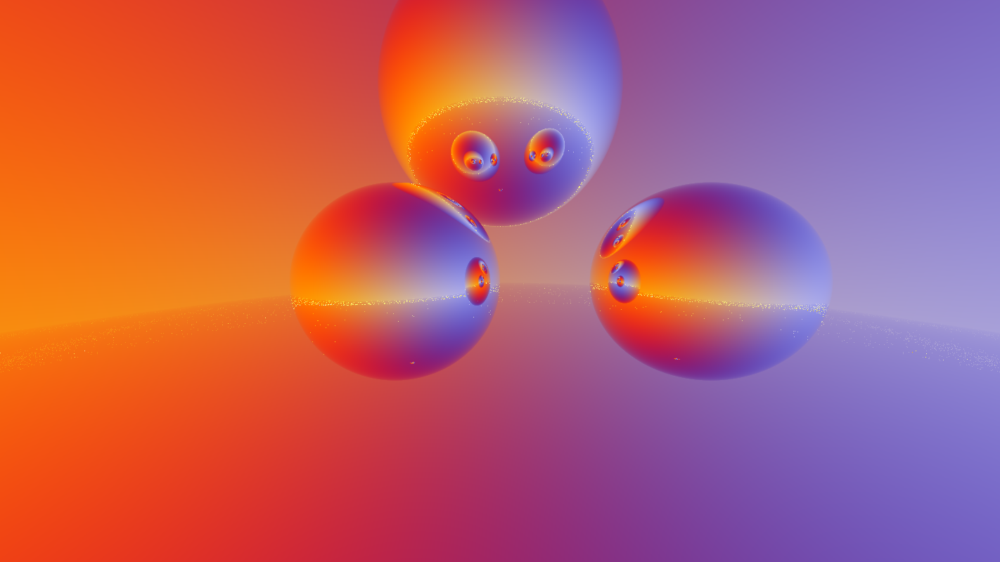

In [8]:
#reflection function, returns the reflection direction
def reflect(dir,normal):
    return unit_vector(dir-2*dot(dir,normal)*normal)
        
#lets define a bg more diverse colors.
def bg_color(ray):
    t0=(ray.dir[0]+1)/2
    t1=(ray.dir[1]+1)/2
    
    C1=vec3([1,0,0])
    C3=vec3([1,1,0])
    C4=vec3([1,1,1])
    C2=vec3([0.2,0.2,0.8])
    return (1-t0)*(1-t1)*C1 + t0*(1-t1)*C2 + t1*(1-t0)*C3 + t1*(t0)*C4

#computing the reflections

def scene5_color(ray, objs):
    max_iter=10
    for i in range(max_iter):        
        hit,surf=objs.hit(ray,t_range=(0.001,1000)) #calculate the hit point and the surface hit
        if hit.no_hit(): #if hit no surface, break, cast the bg color
            break
        reflected_dir=reflect(ray.dir,hit.normal) #if hit something, define a new ray 
        ray.origin=hit.point #change the ray origin and direction
        ray.dir=reflected_dir


    return bg_color(ray)
    

h=800
w=int(aspect_ratio*h)
image = torch.zeros(3,h,w)

print(f"Scene 5, reflections ({h}x{w})")
for i in range(h):
    if int(100*i/h) % 10==0:
        print(f"{int(100*i/h)}%",end='...')
    for j in range(w):
        u=i/h
        v=j/w
        dir = lower_left +v*X+u*Y - origin
        ray = ray=Ray(origin,dir)

        color = scene5_color(ray,objs)
        image[:,i,j]=color

showImg(image)     

## Triangles
https://www.scratchapixel.com/lessons/3d-basic-rendering/ray-tracing-rendering-a-triangle/ray-triangle-intersection-geometric-solution#:~:text=The%20ray%20can%20intersect%20the,these%20two%20vectors%20is%200).

Scene 6, add triangle (800x1422)
0%...

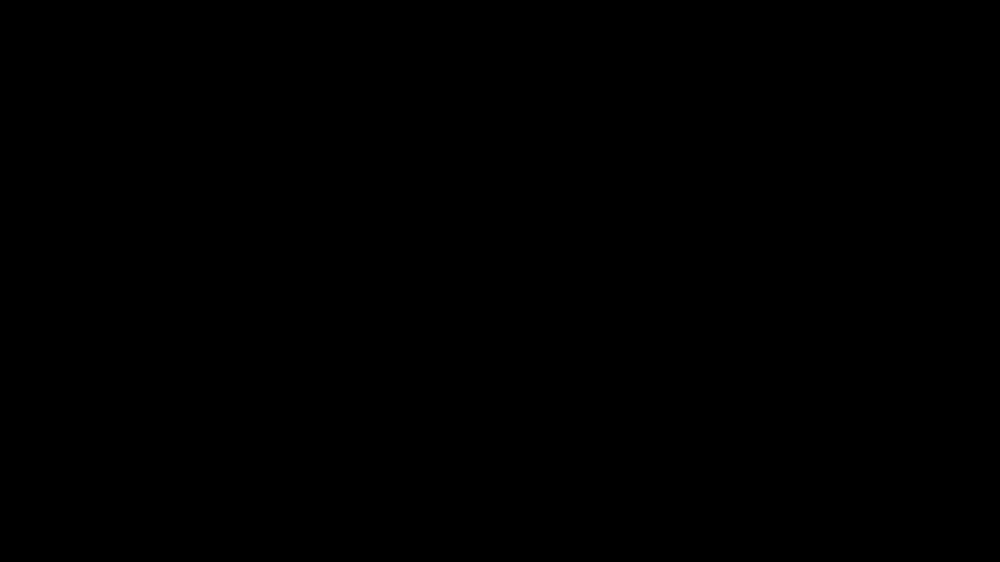

0%...

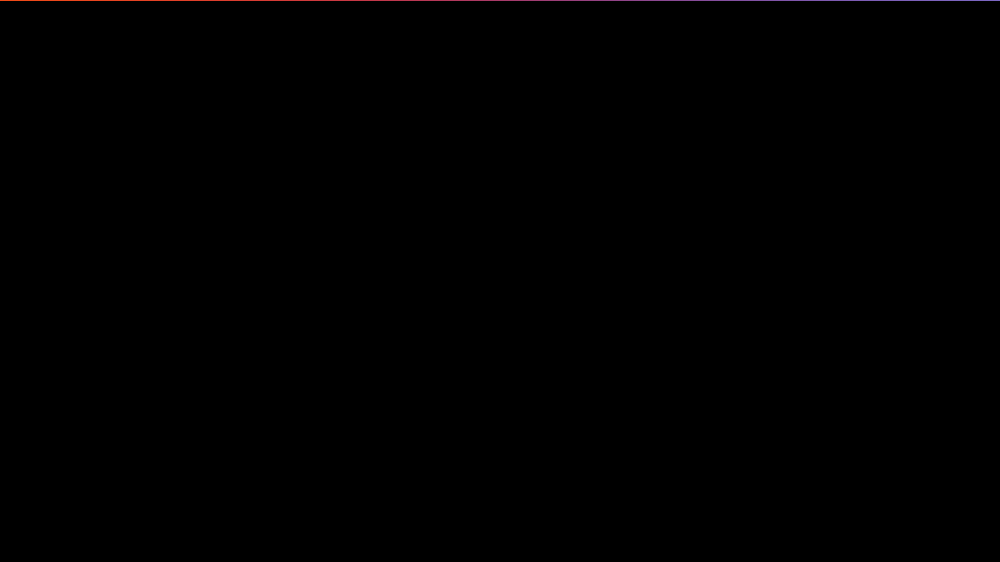

0%...

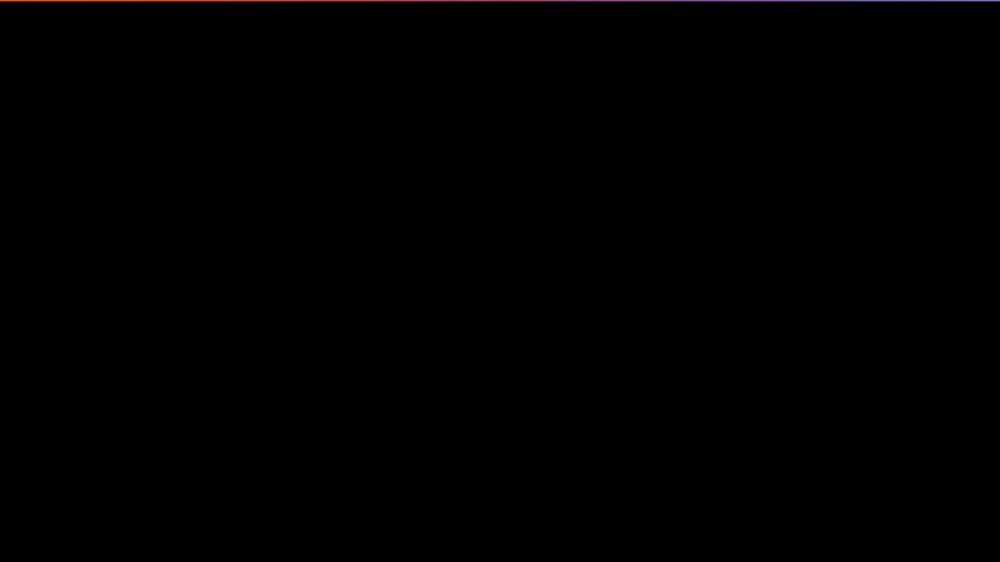

0%...

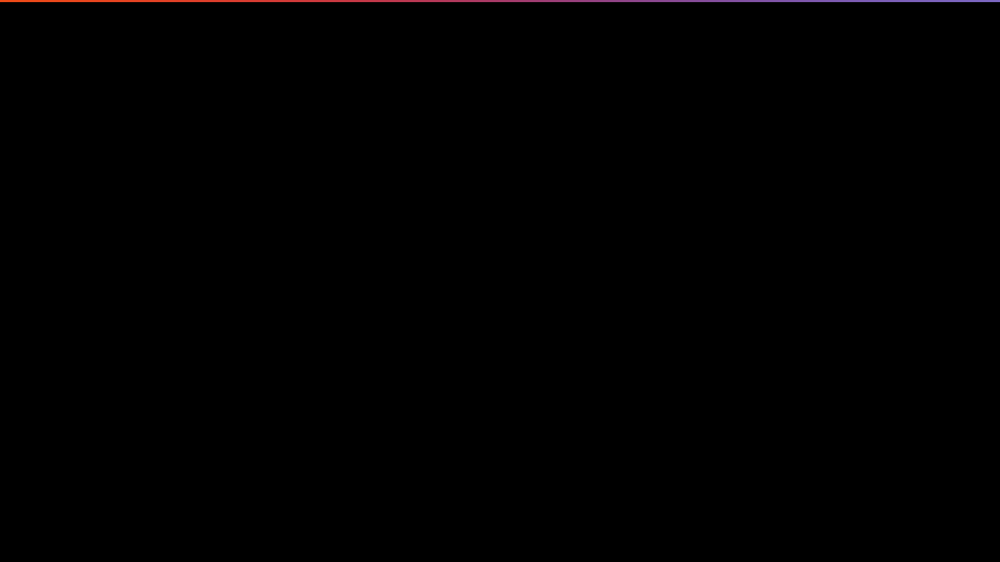

0%...

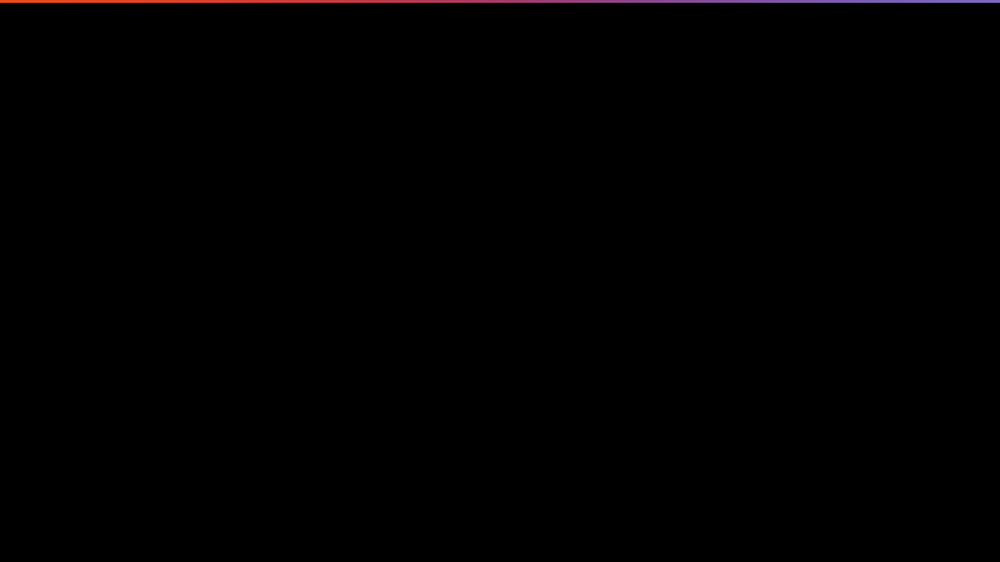

0%...

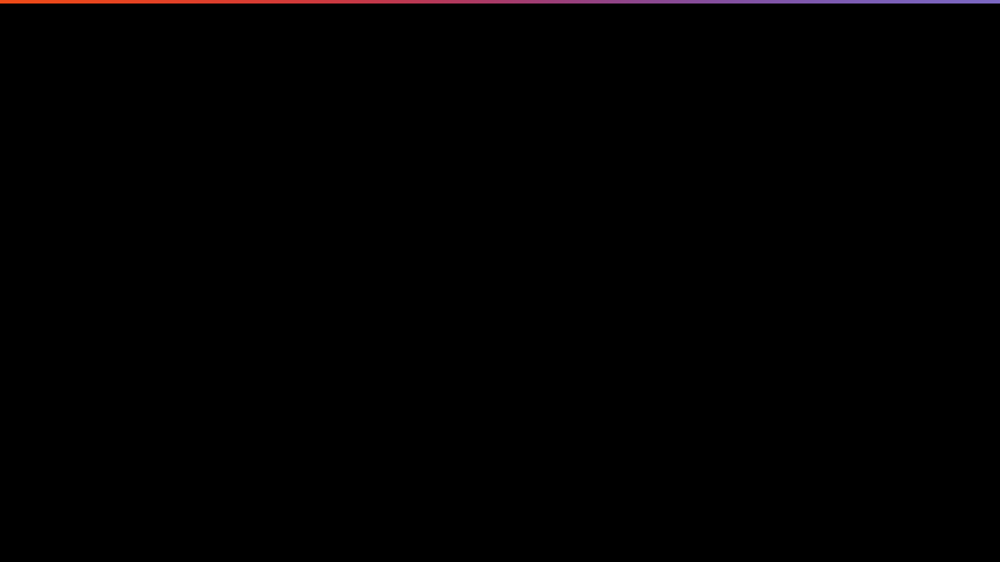

0%...

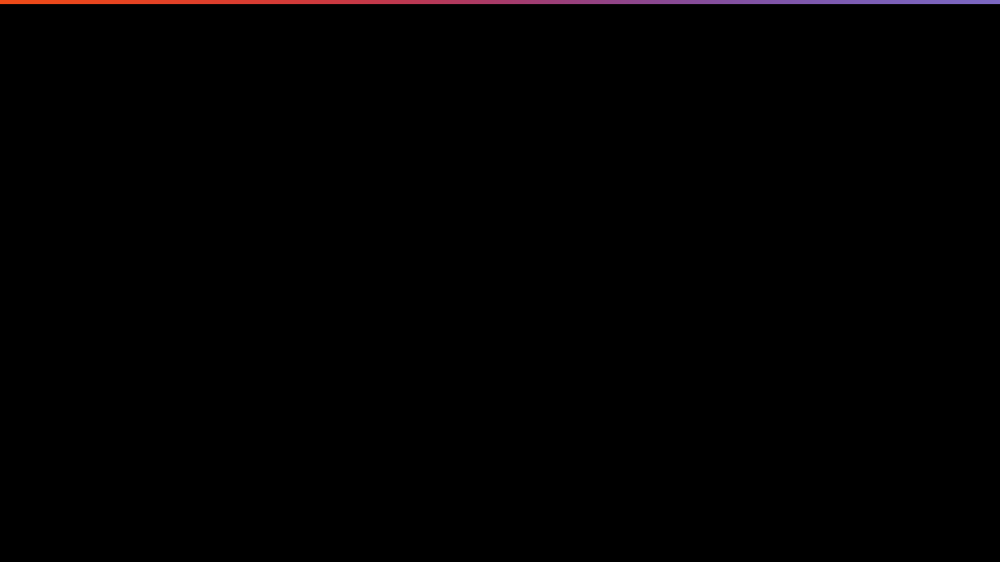

0%...

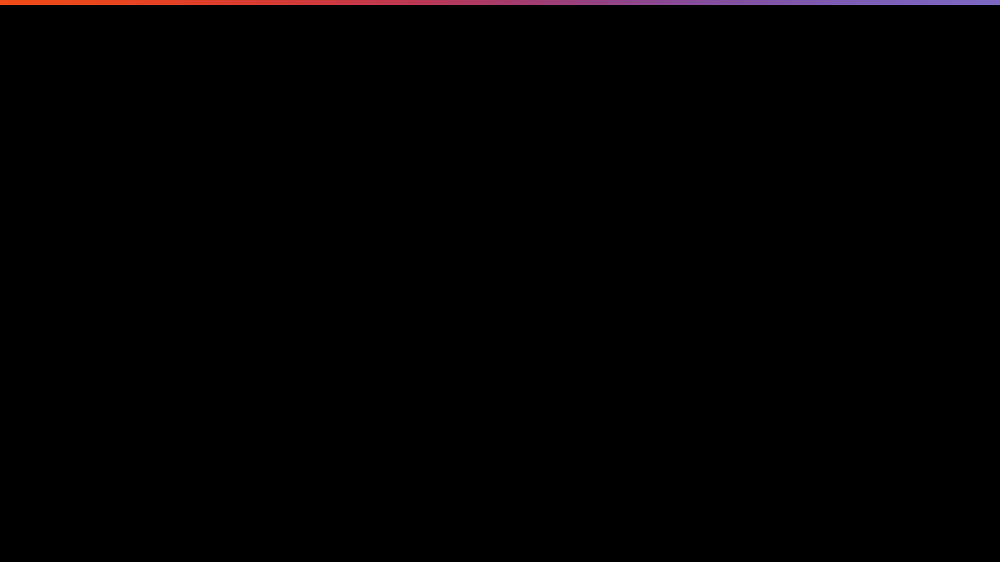

10%...

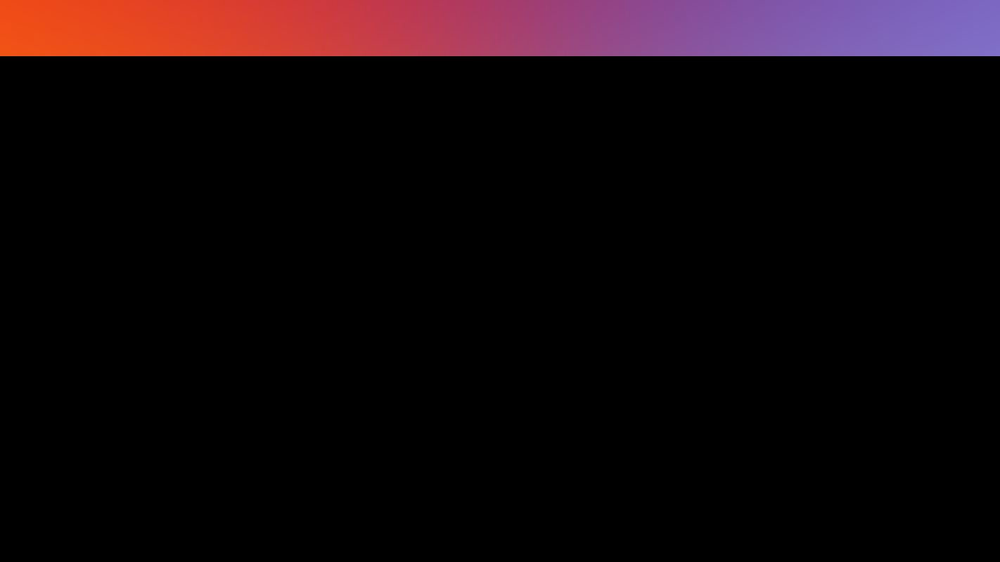

10%...

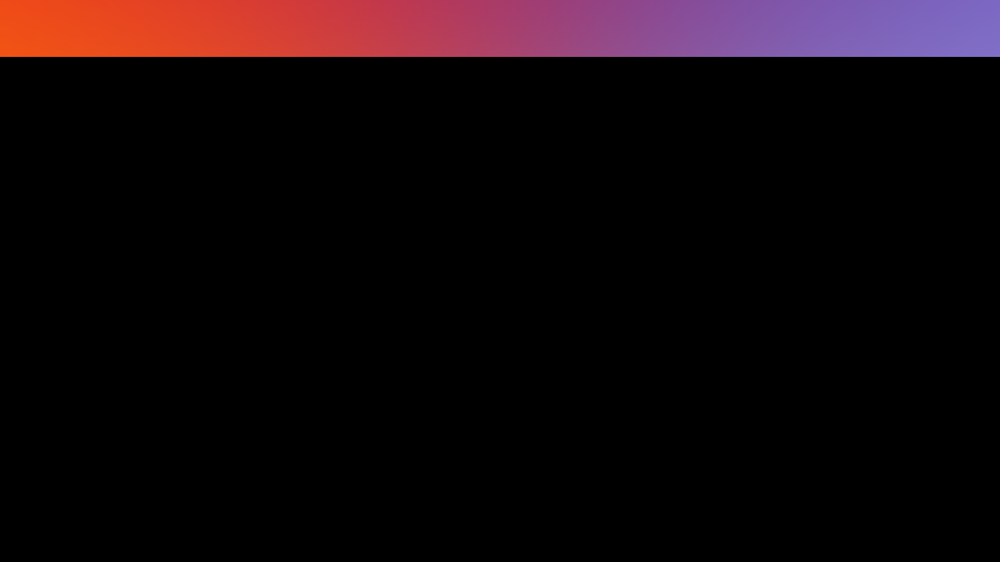

10%...

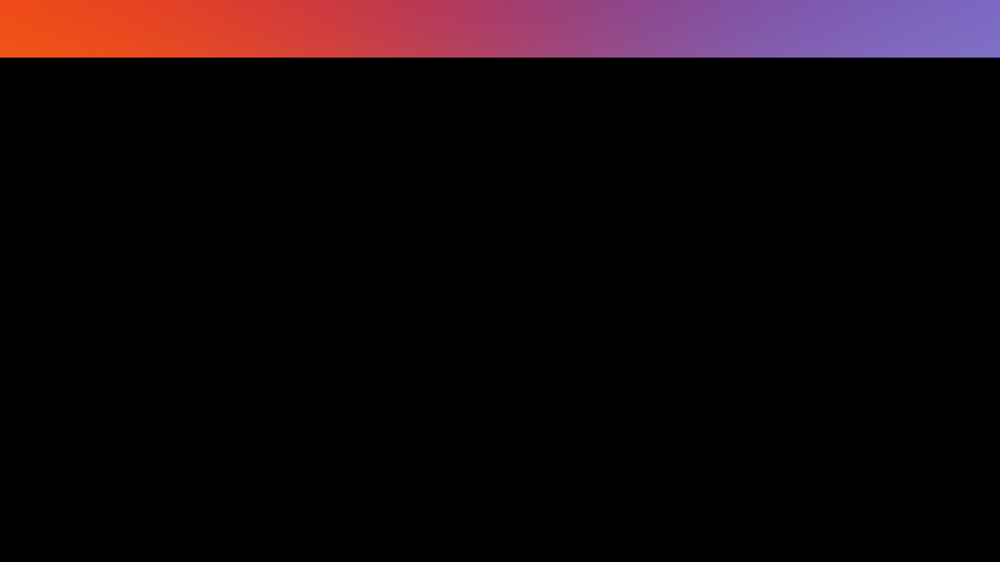

10%...

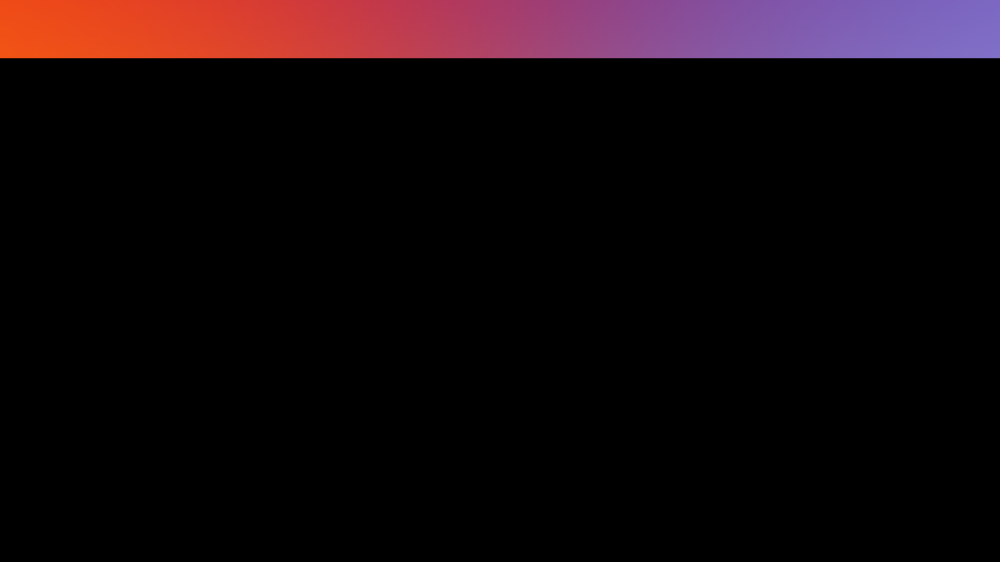

10%...

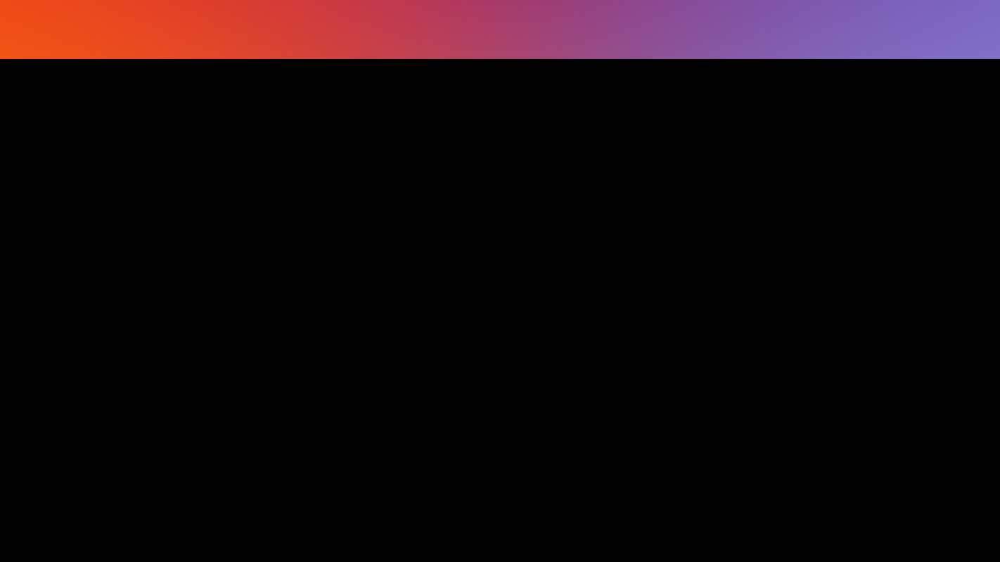

10%...

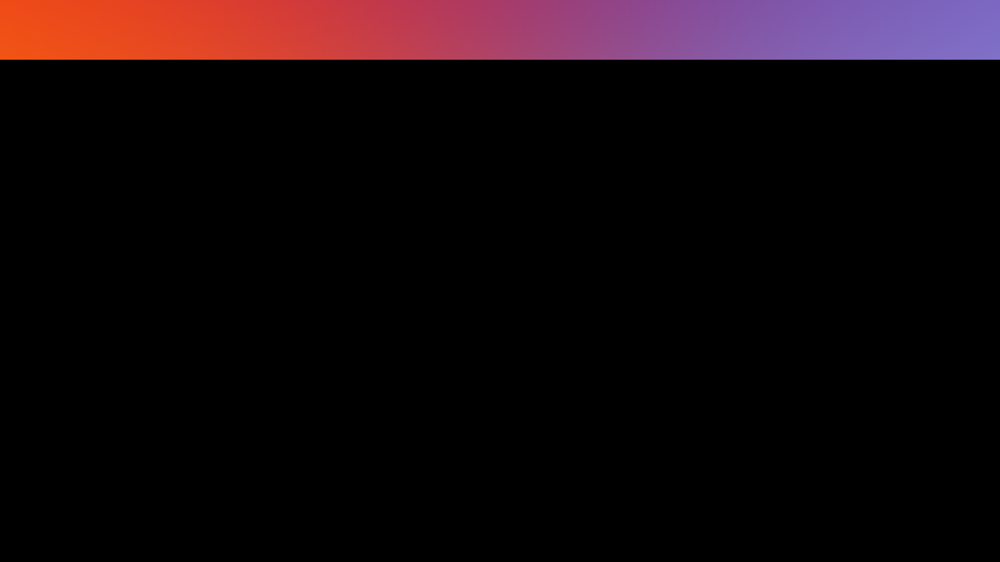

10%...

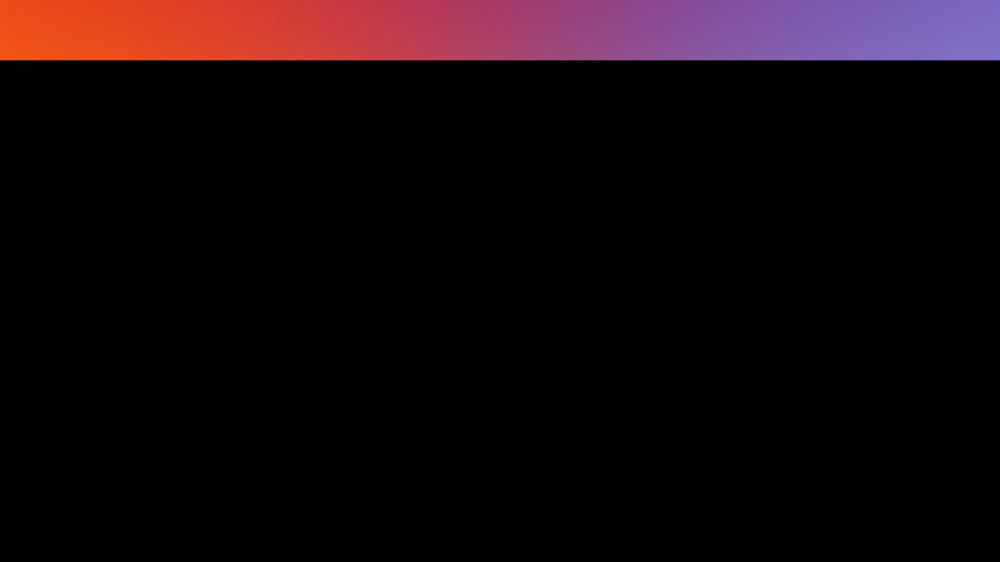

10%...

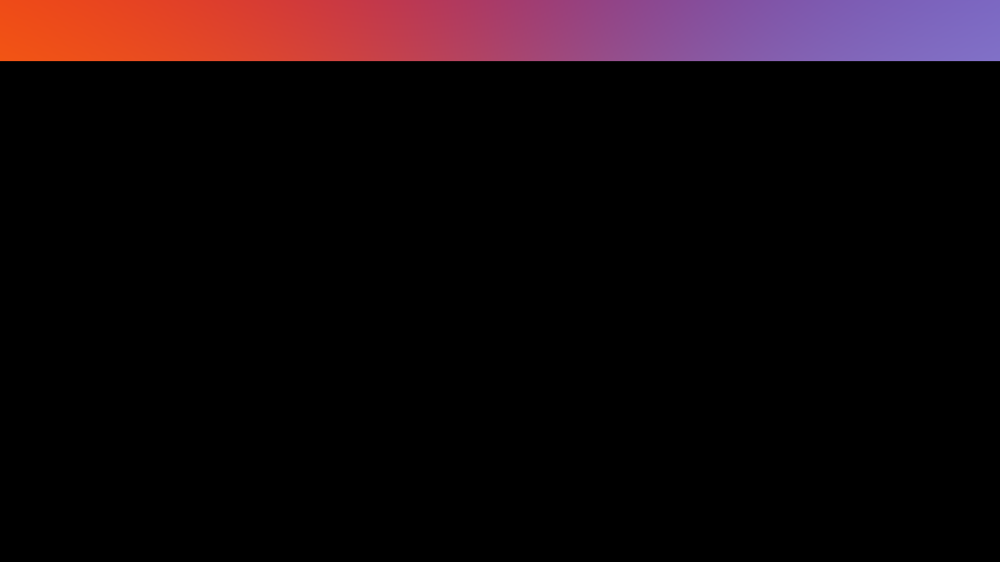

20%...

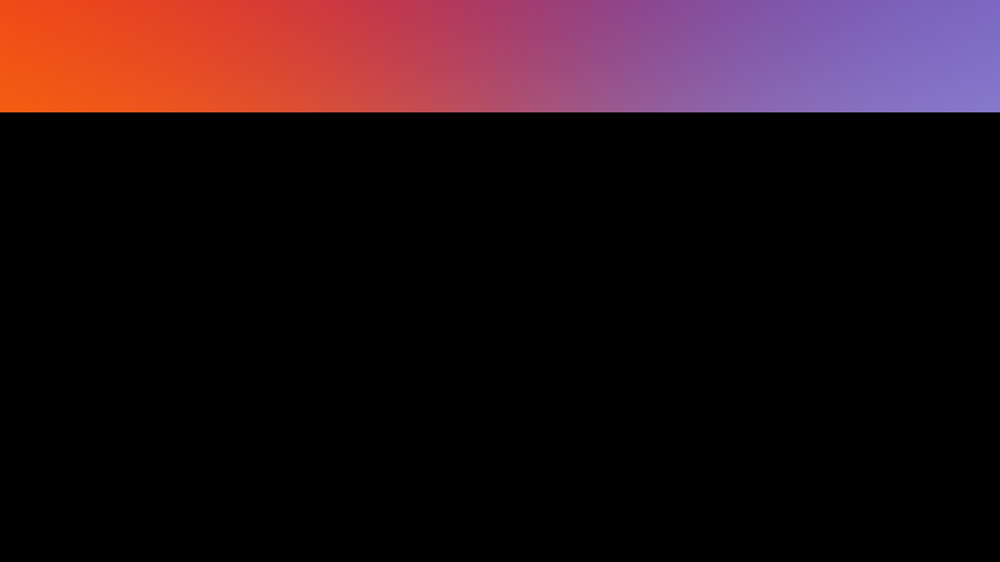

20%...

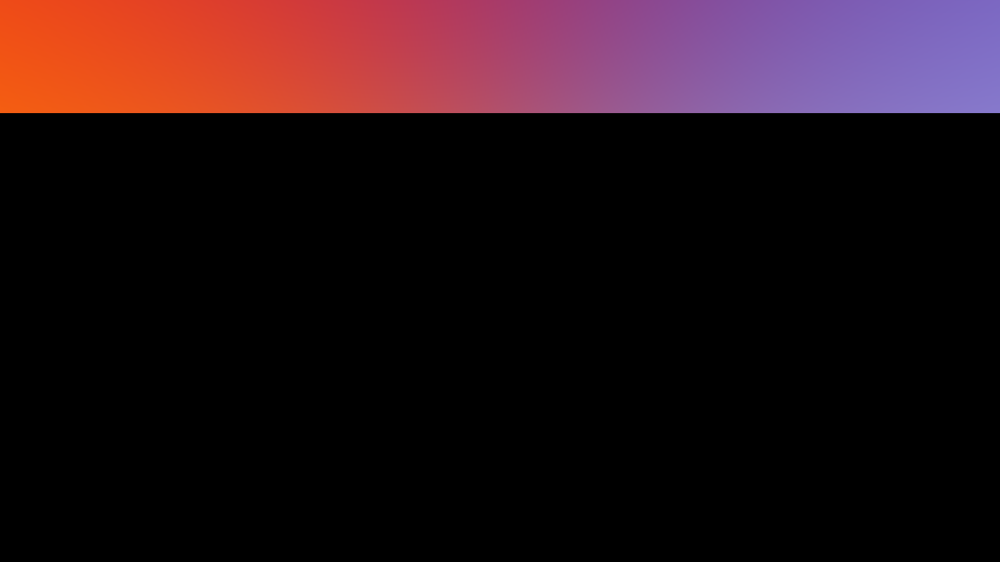

20%...

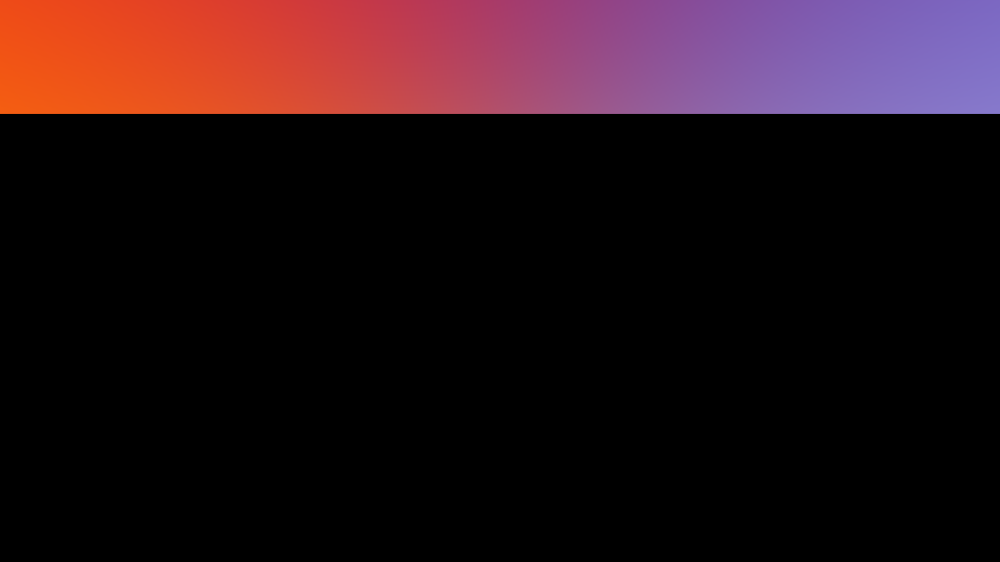

20%...

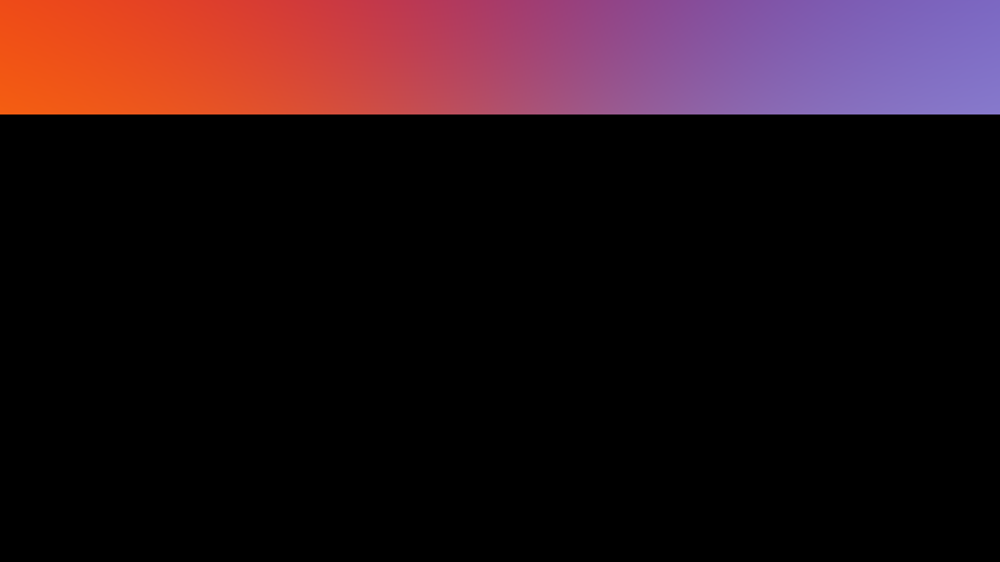

20%...

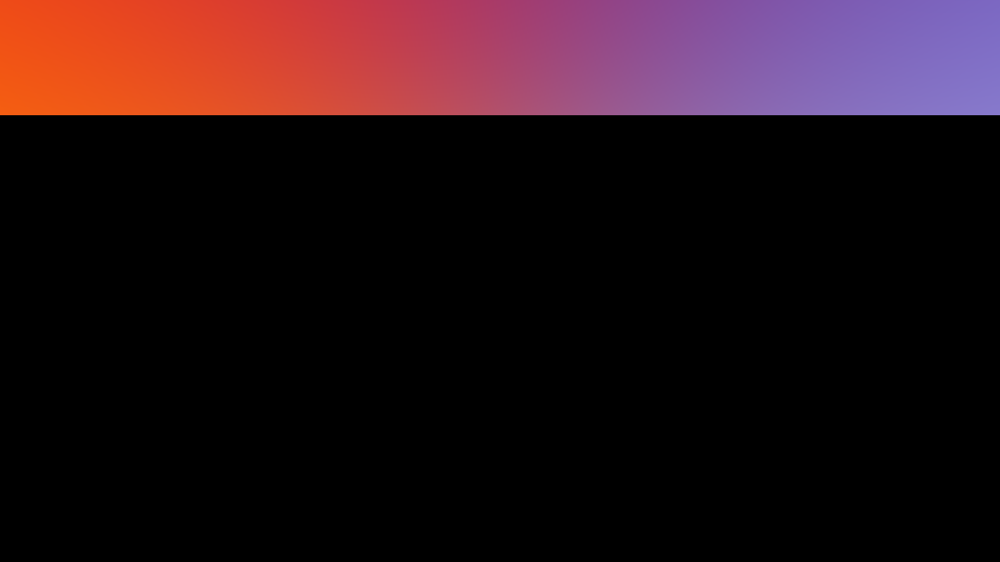

20%...

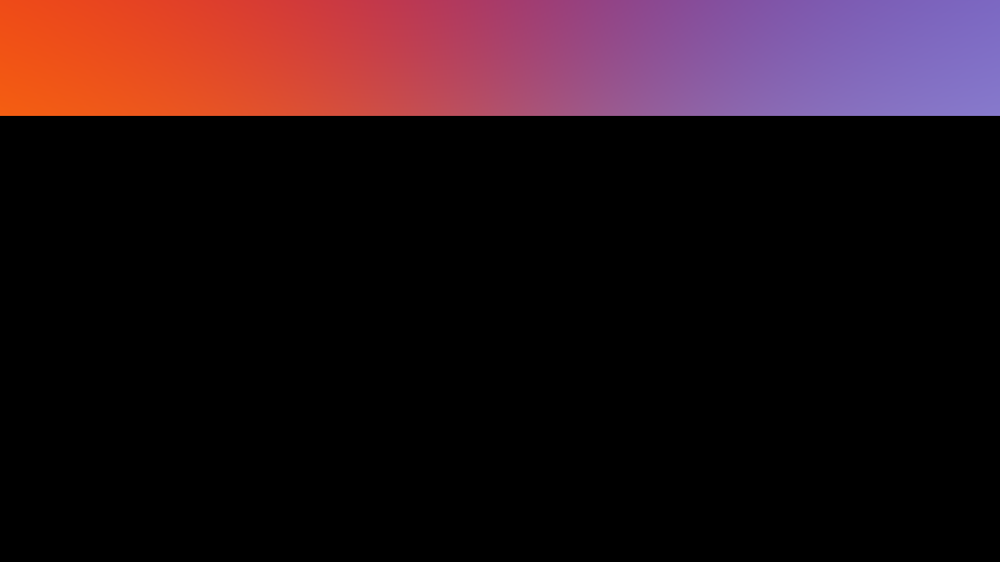

20%...

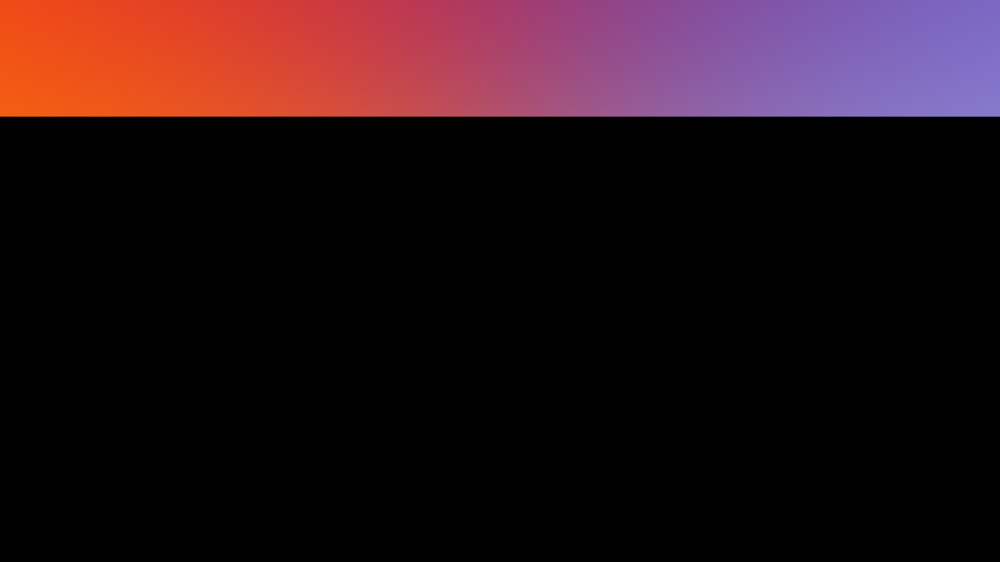

20%...

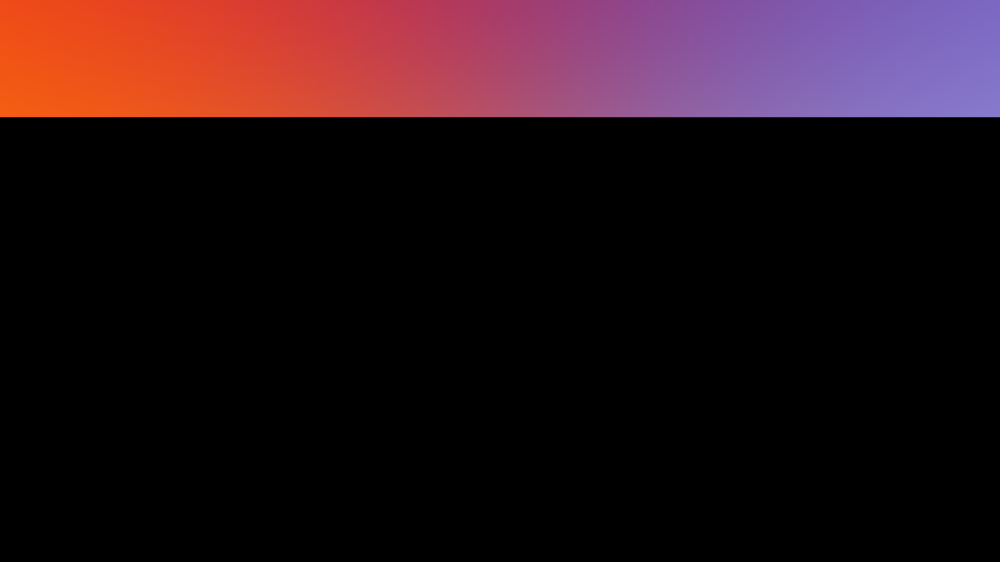

30%...

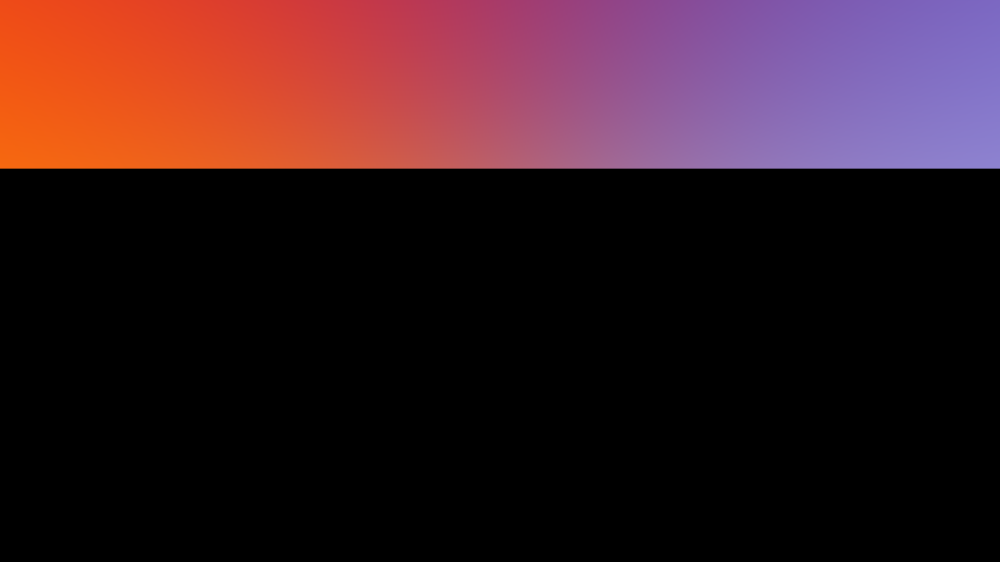

30%...

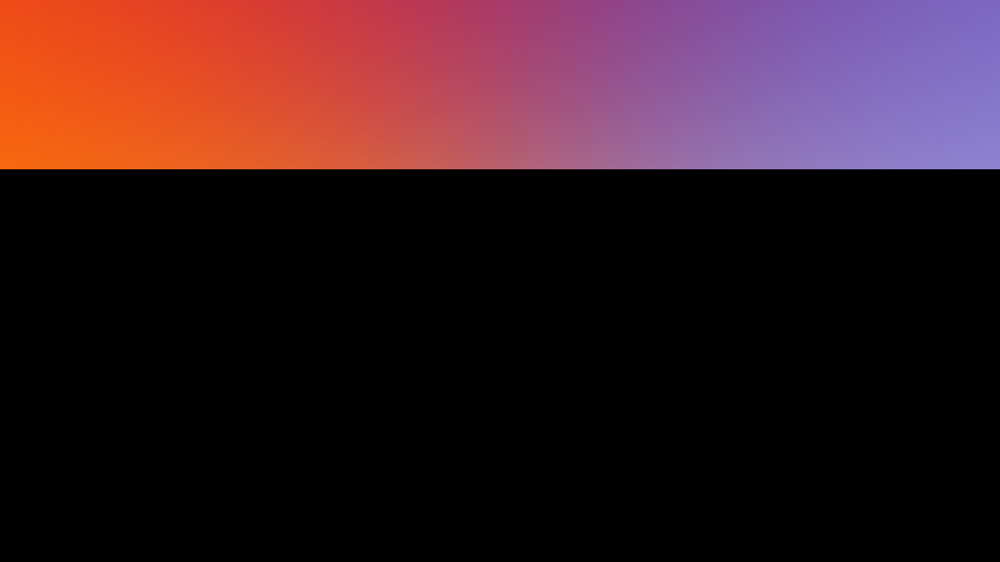

30%...

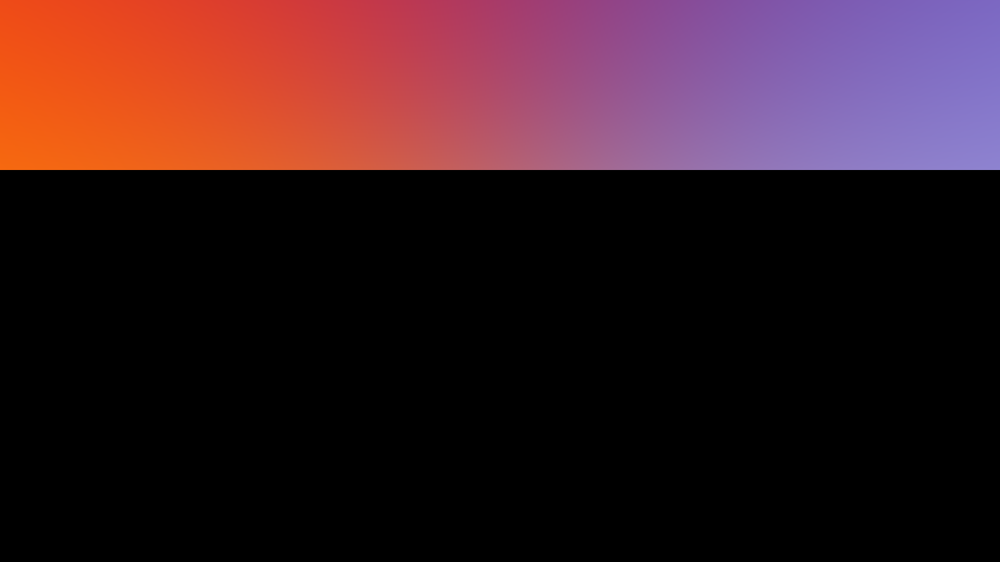

30%...

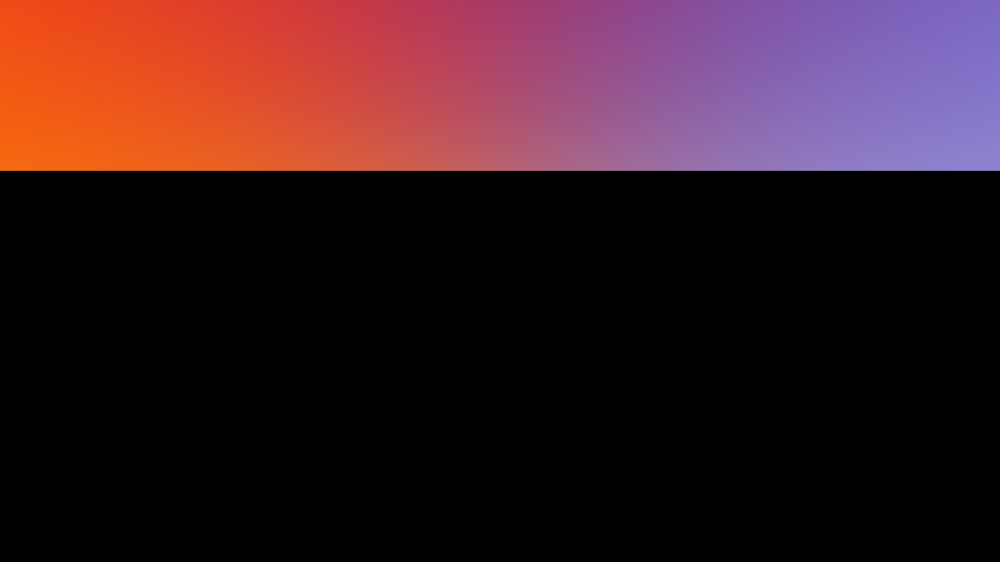

30%...

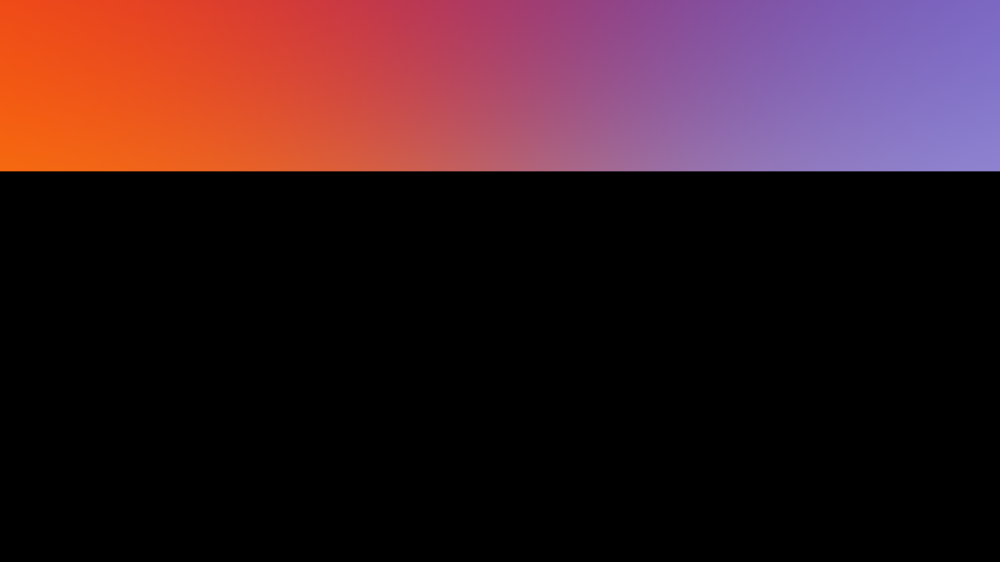

30%...

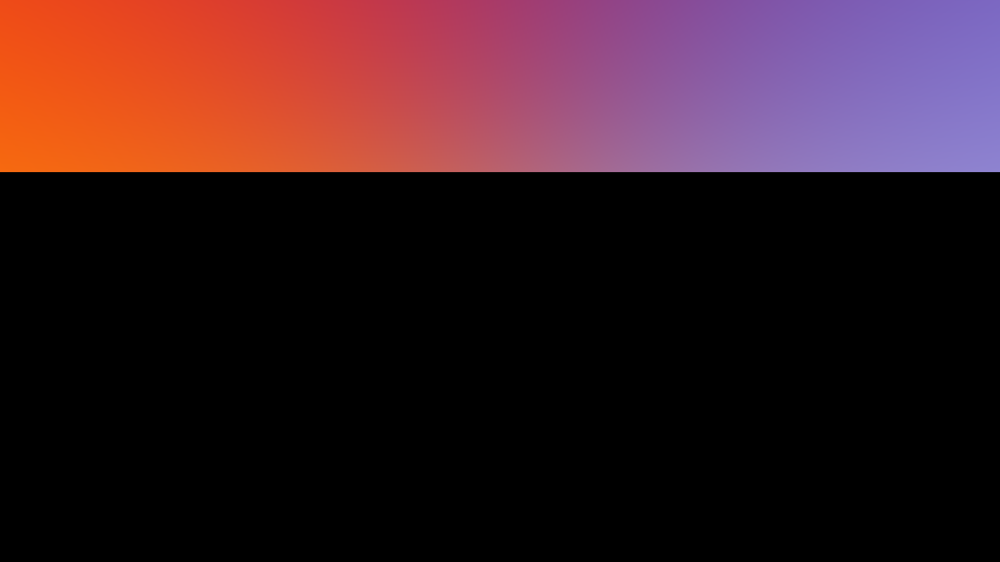

30%...

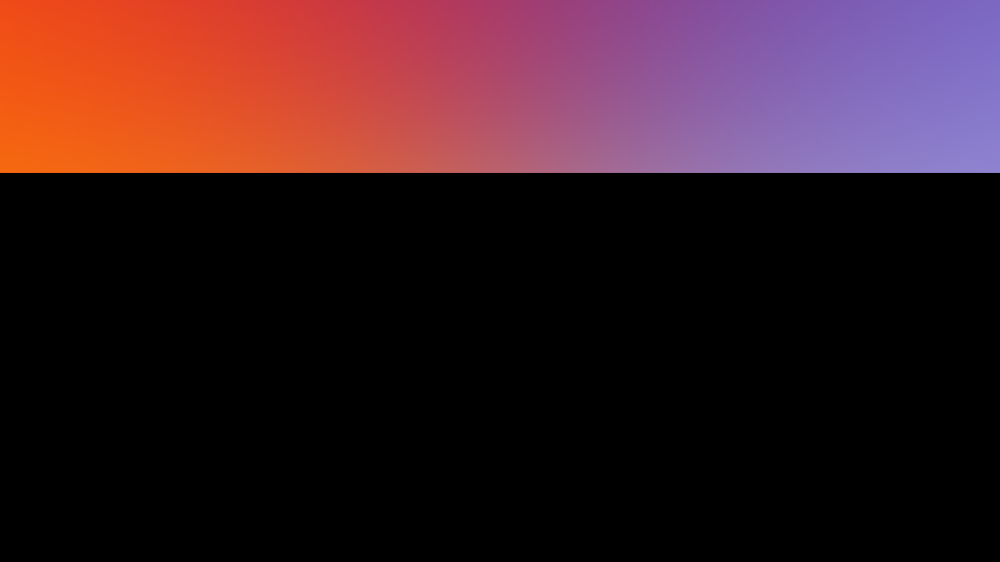

30%...

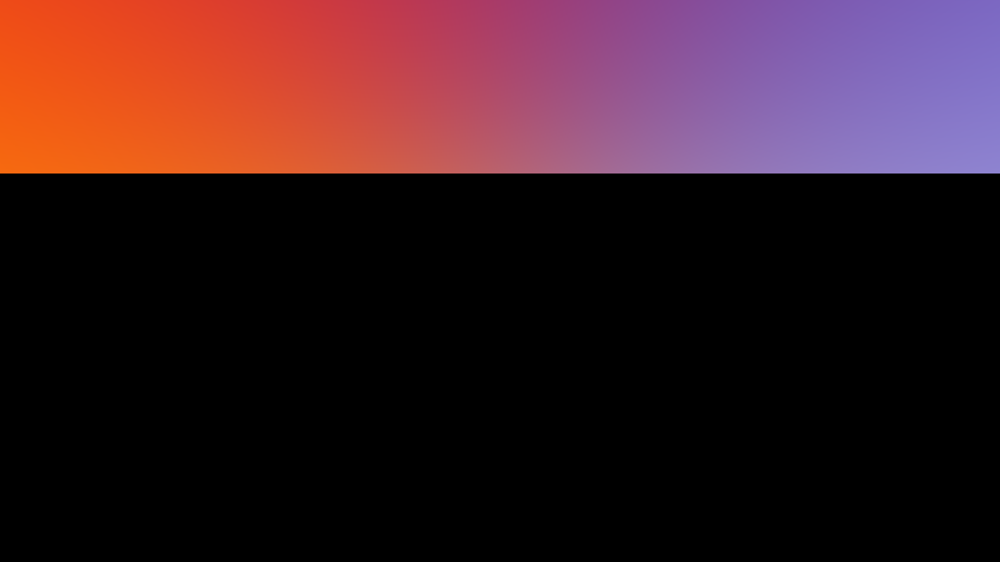

40%...

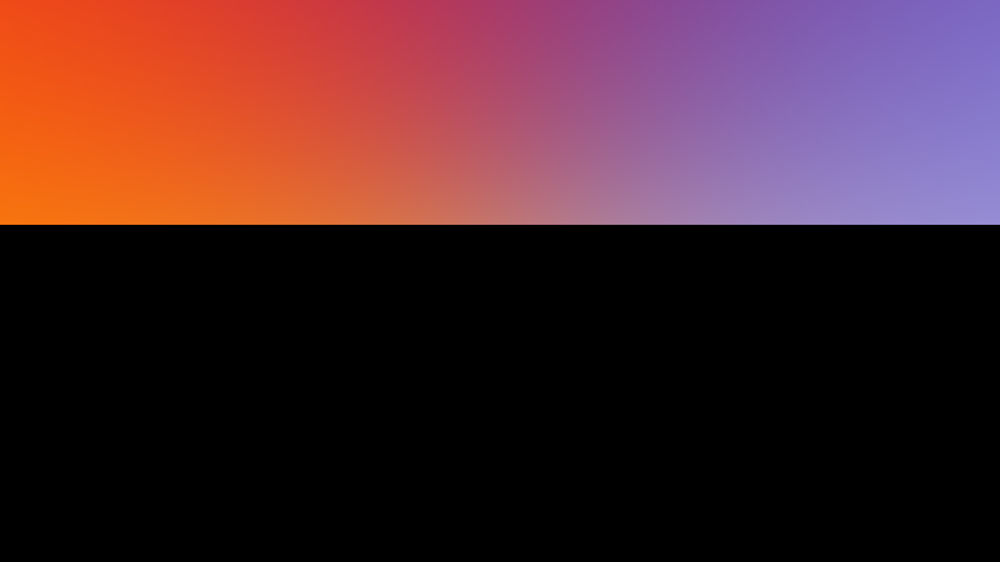

40%...

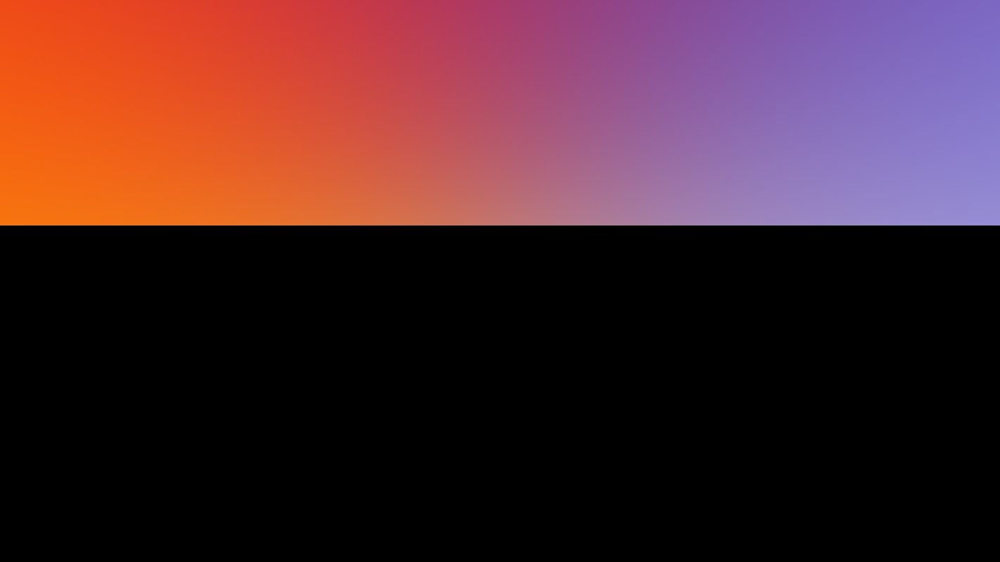

40%...

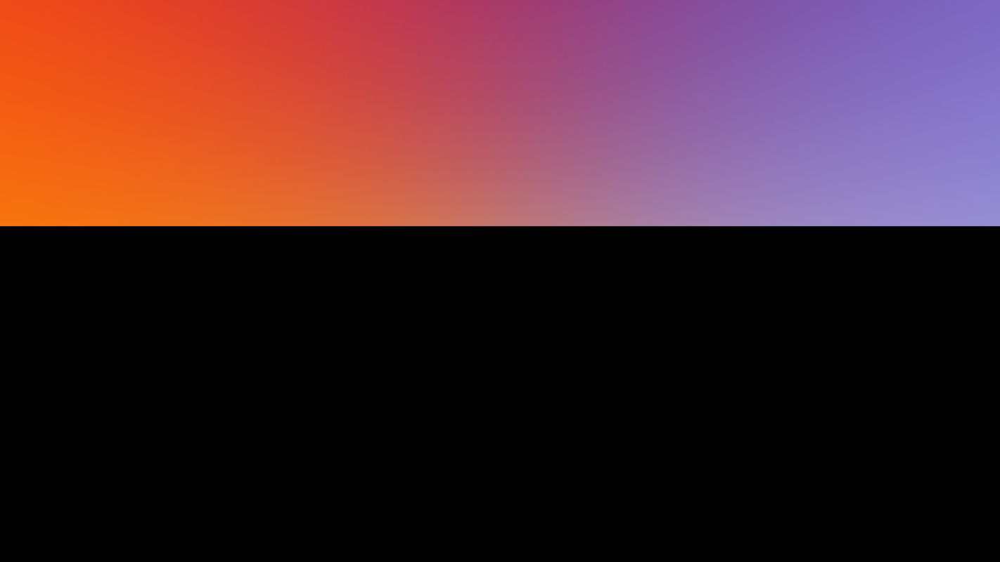

40%...

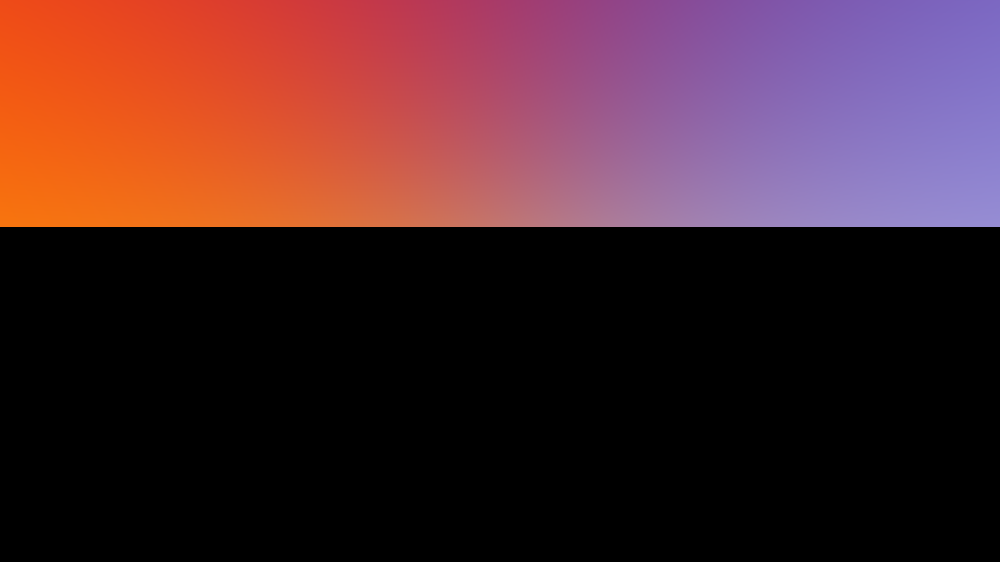

40%...

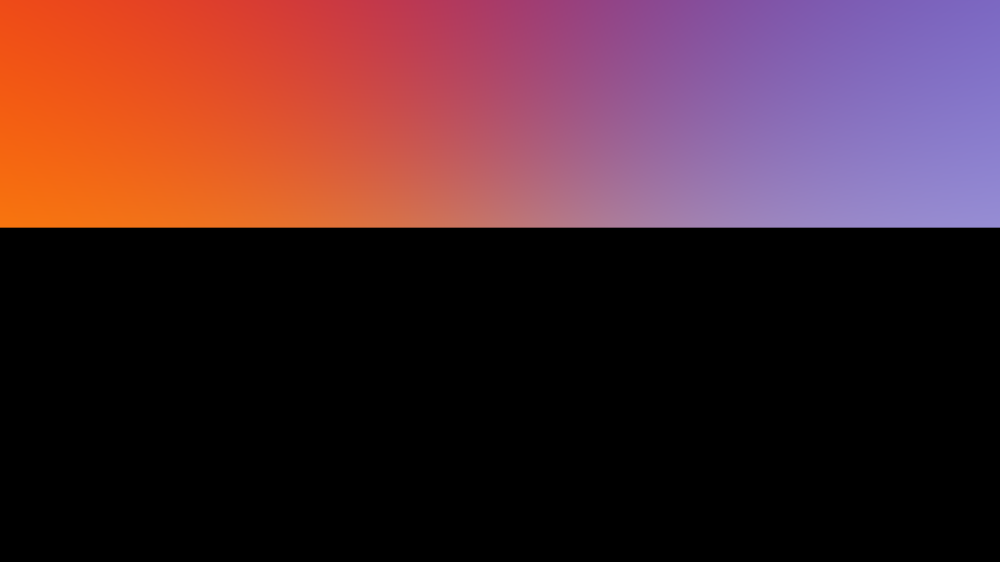

40%...

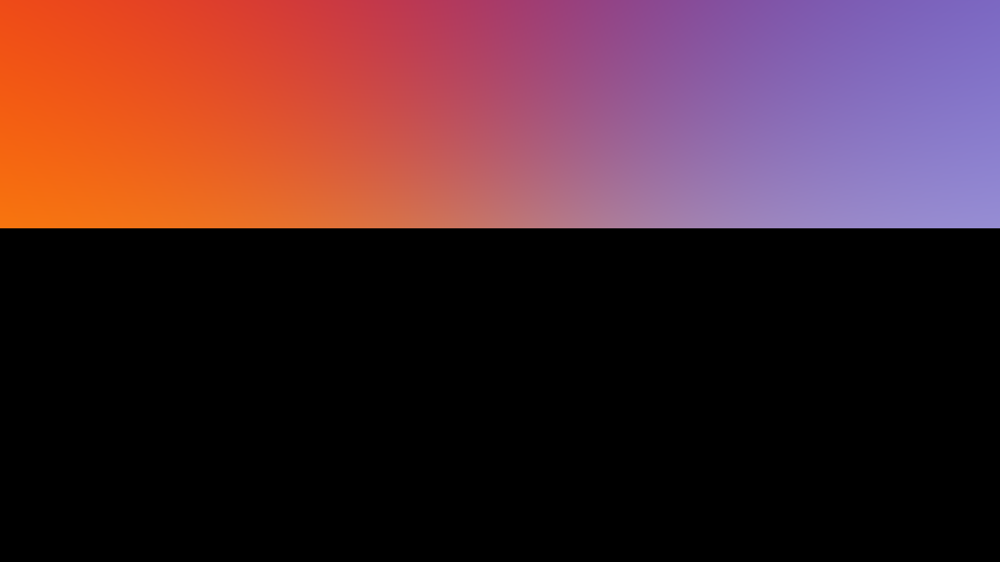

40%...

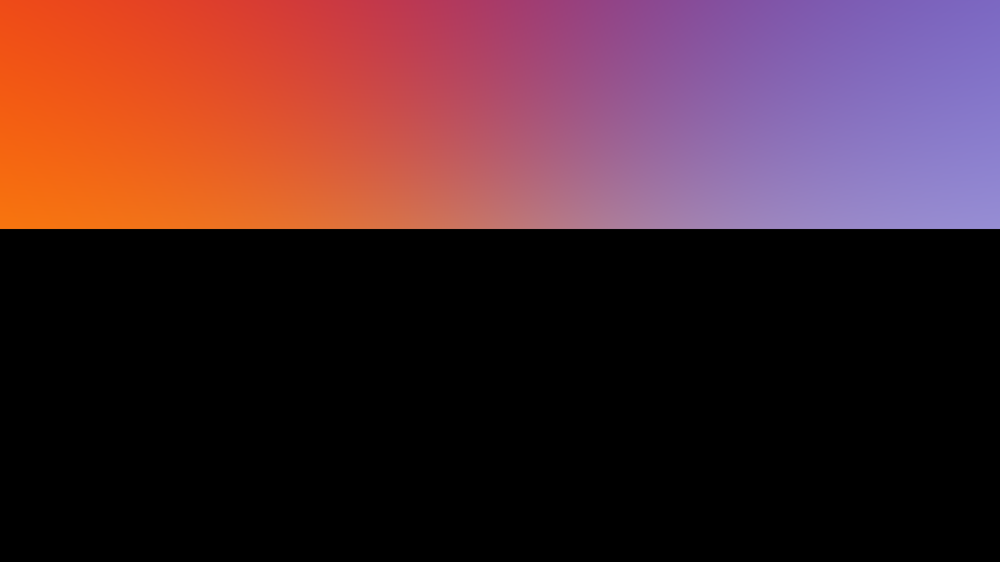

40%...

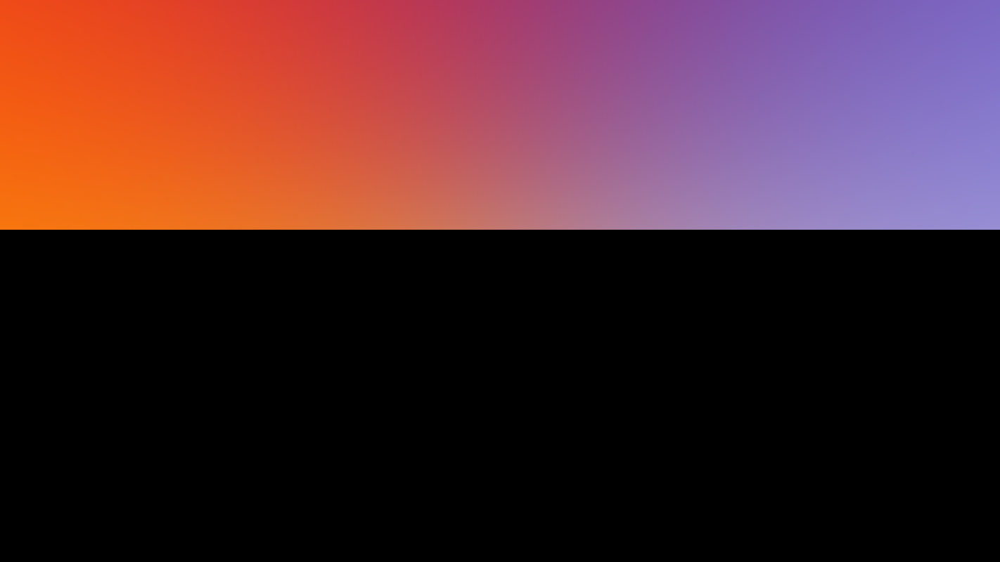

50%...

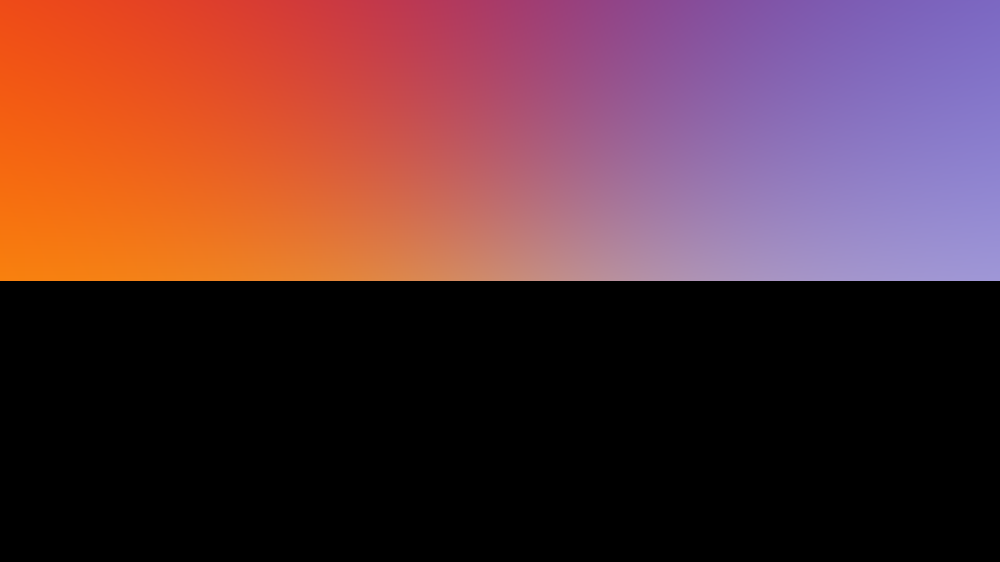

50%...

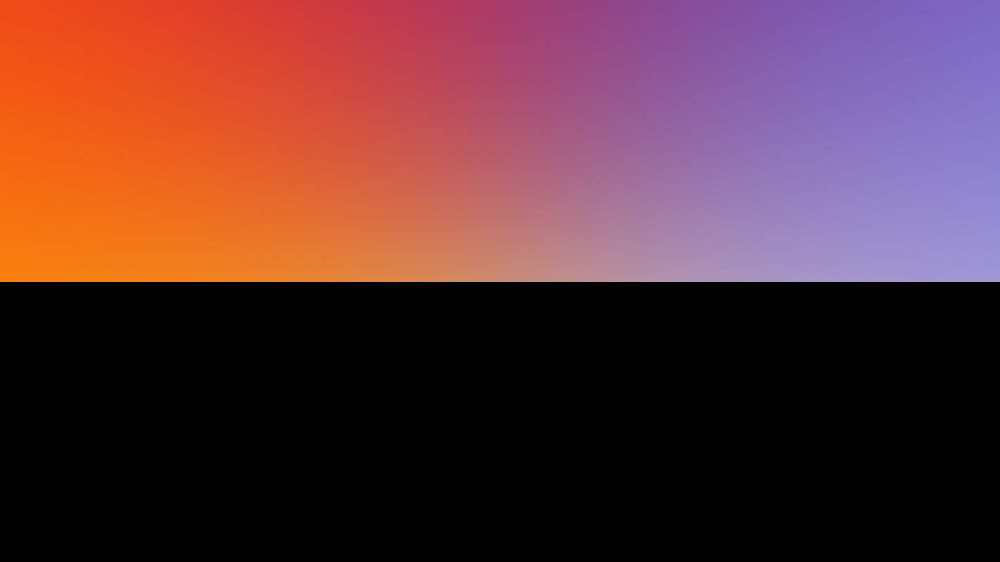

50%...

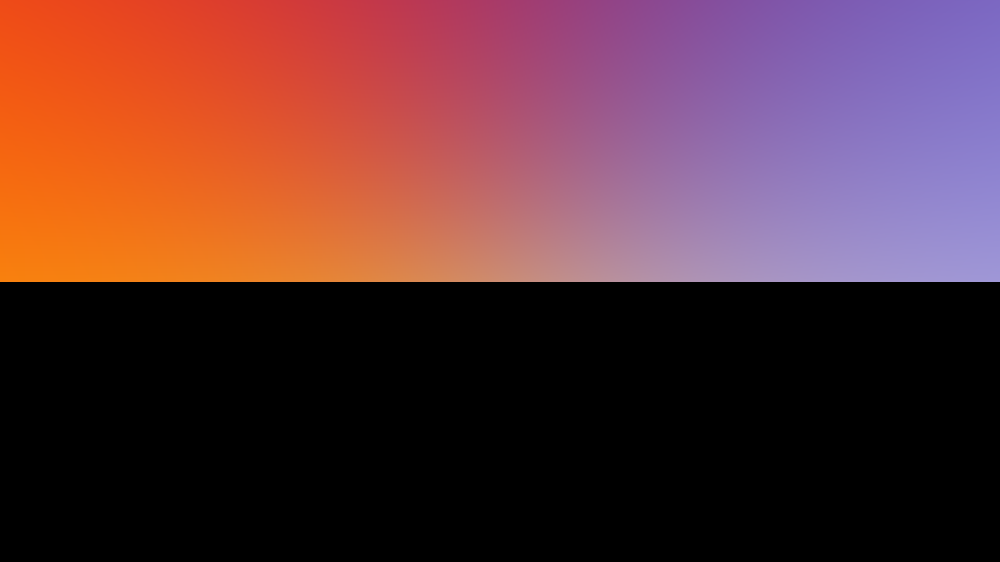

50%...

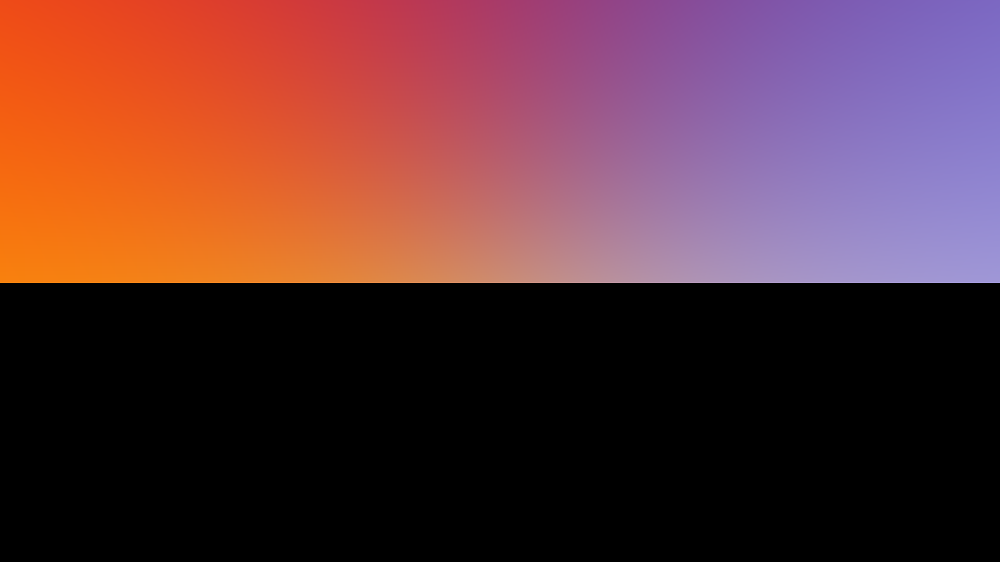

50%...

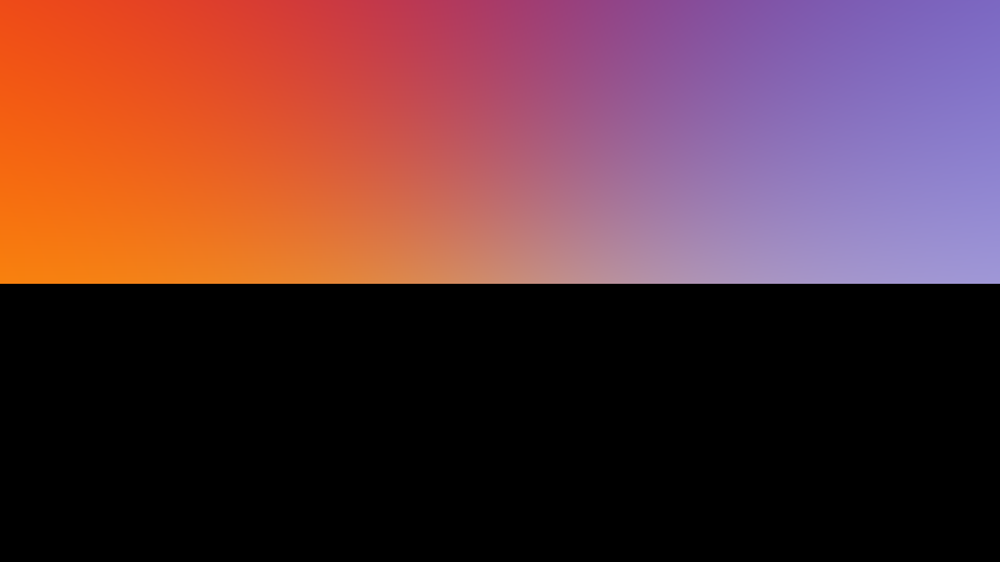

50%...

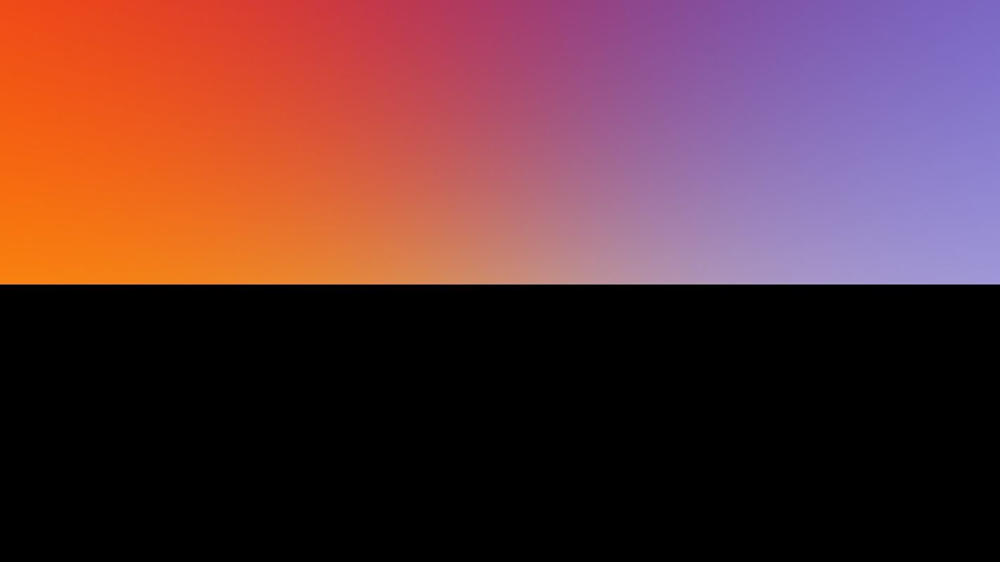

50%...

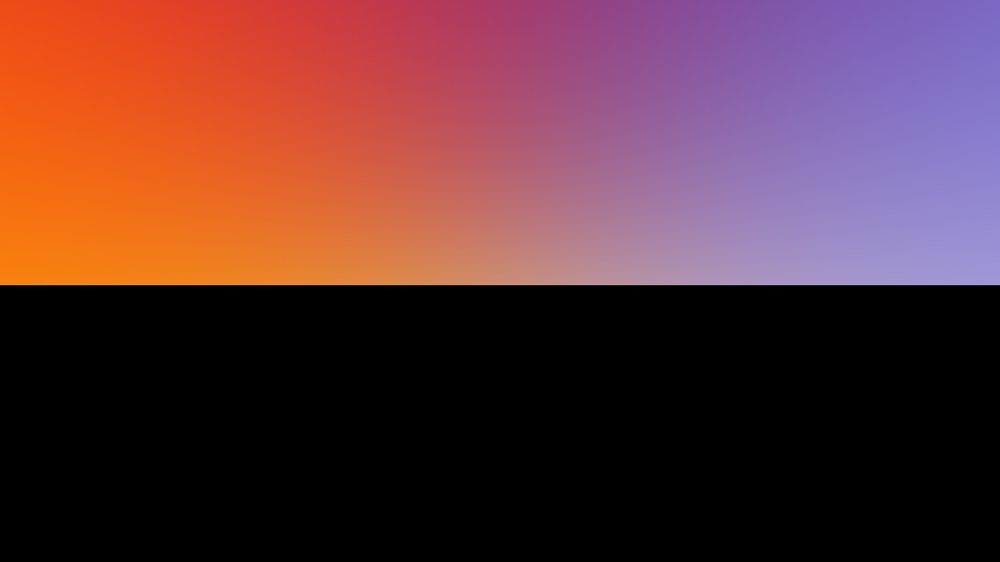

50%...

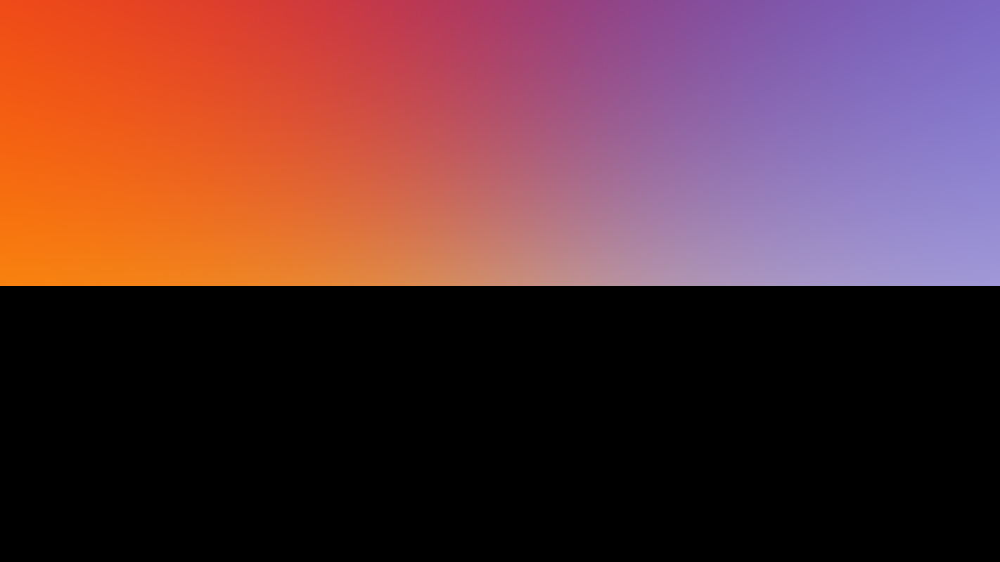

60%...

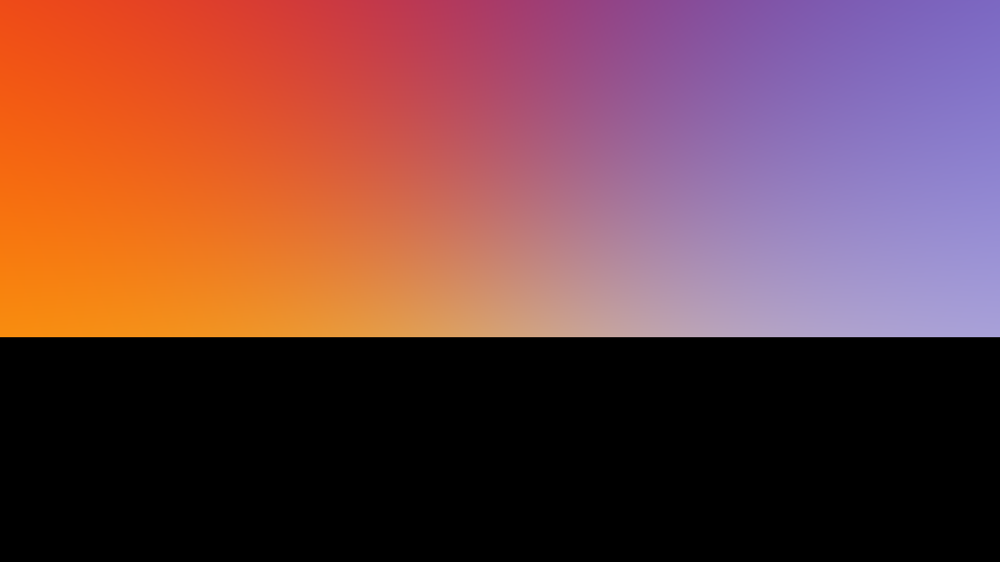

60%...

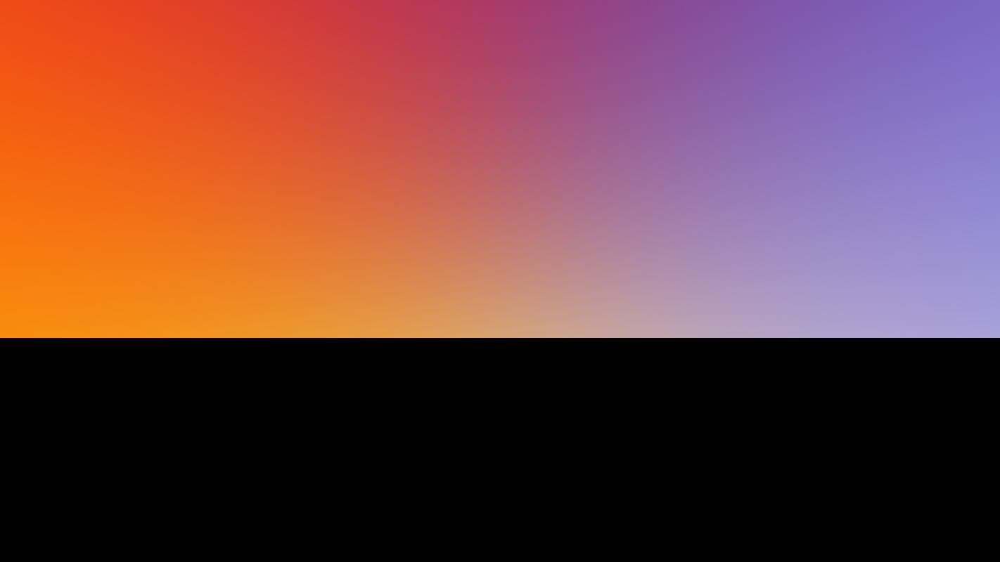

60%...

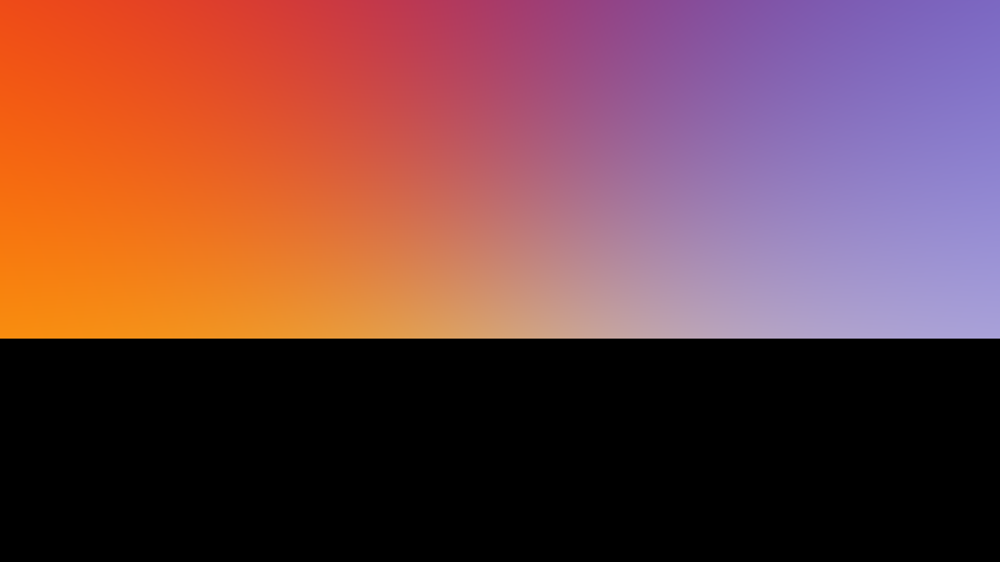

60%...

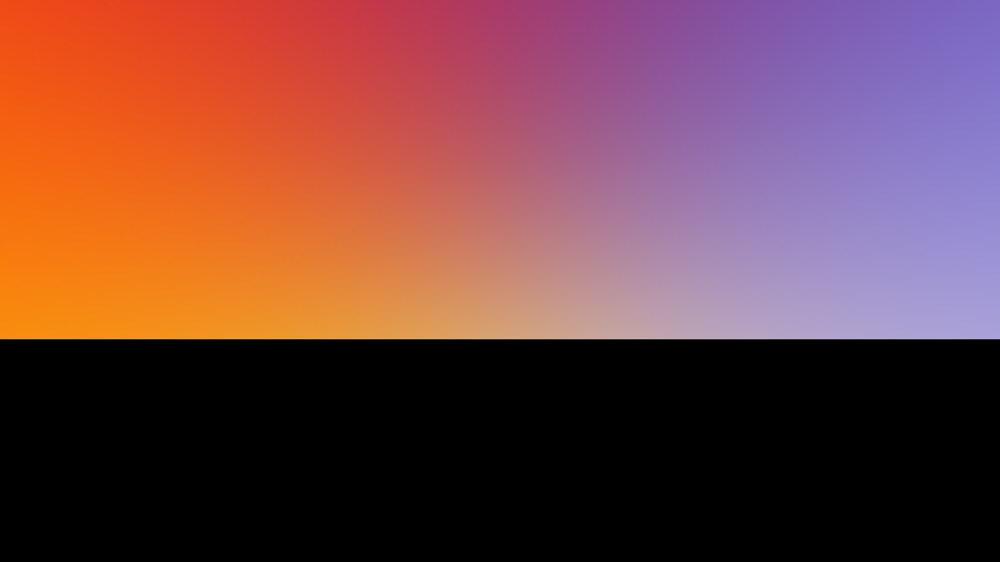

60%...

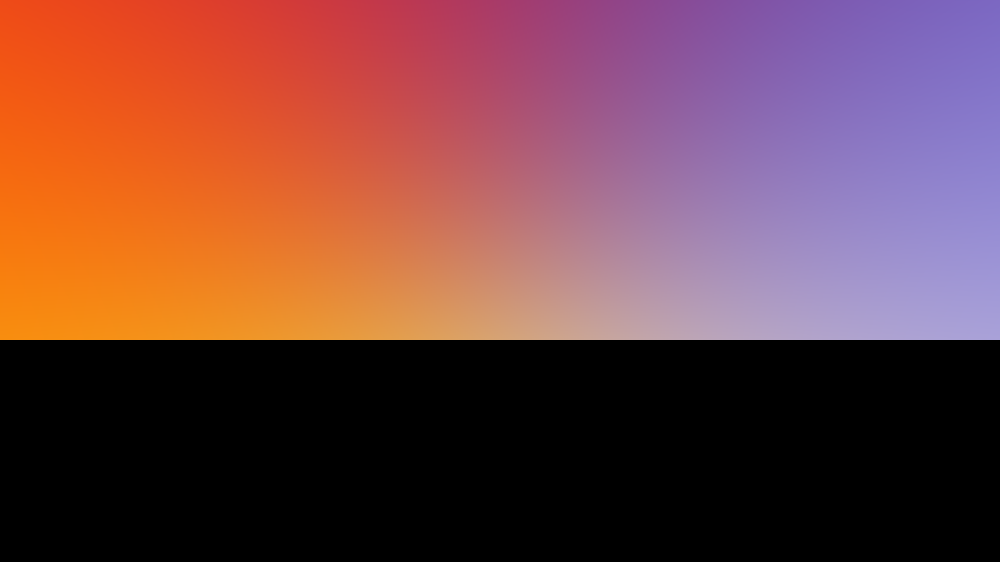

60%...

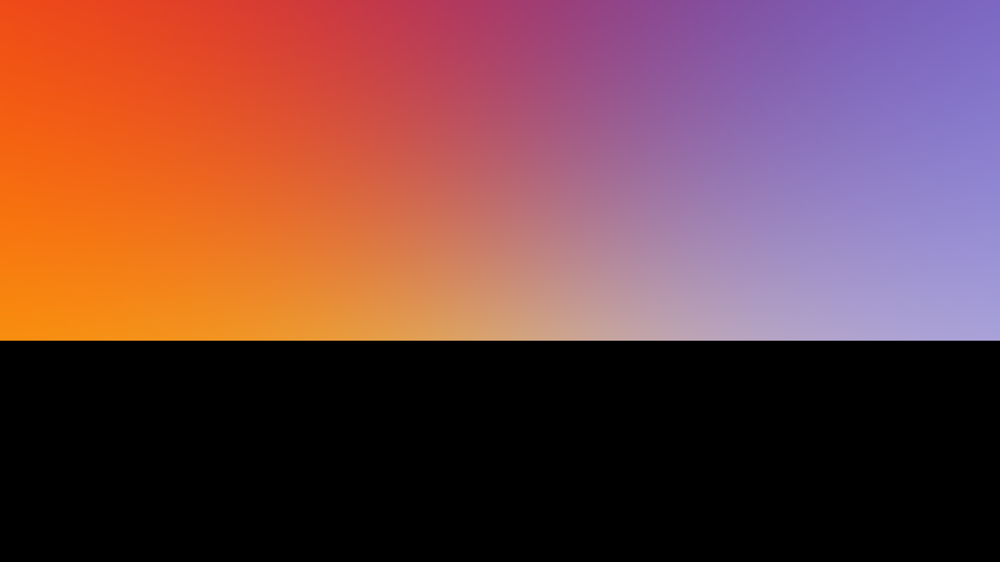

60%...

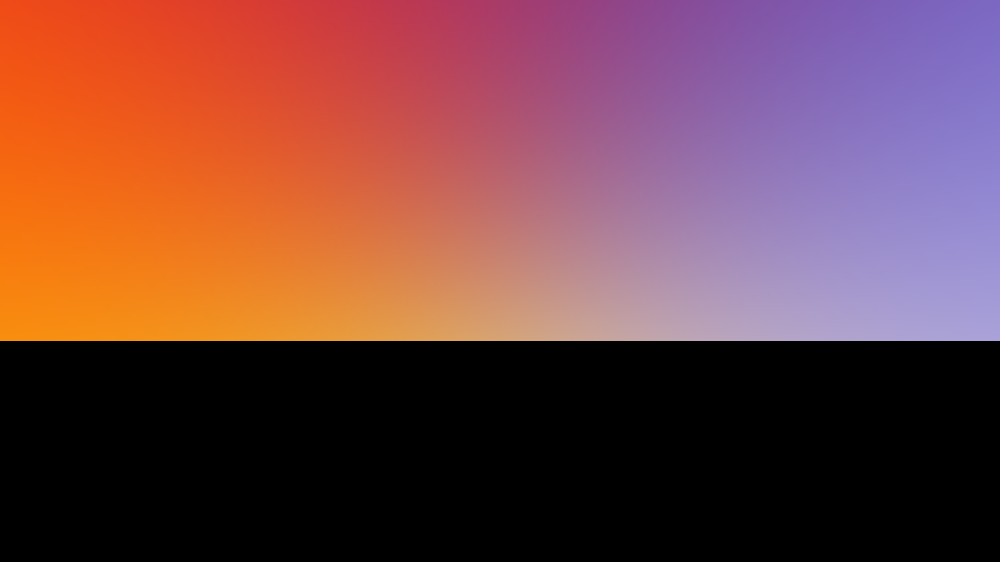

60%...

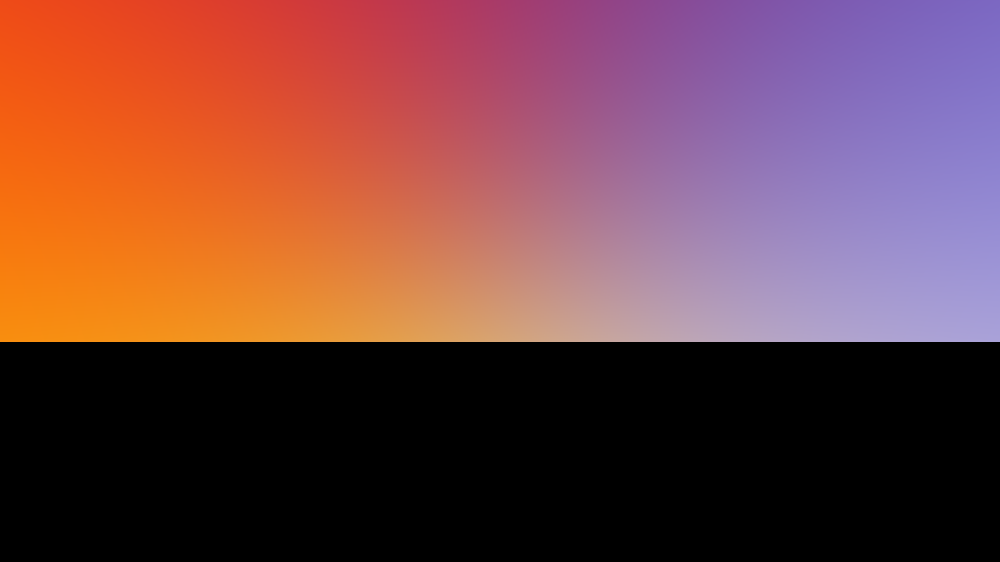

70%...

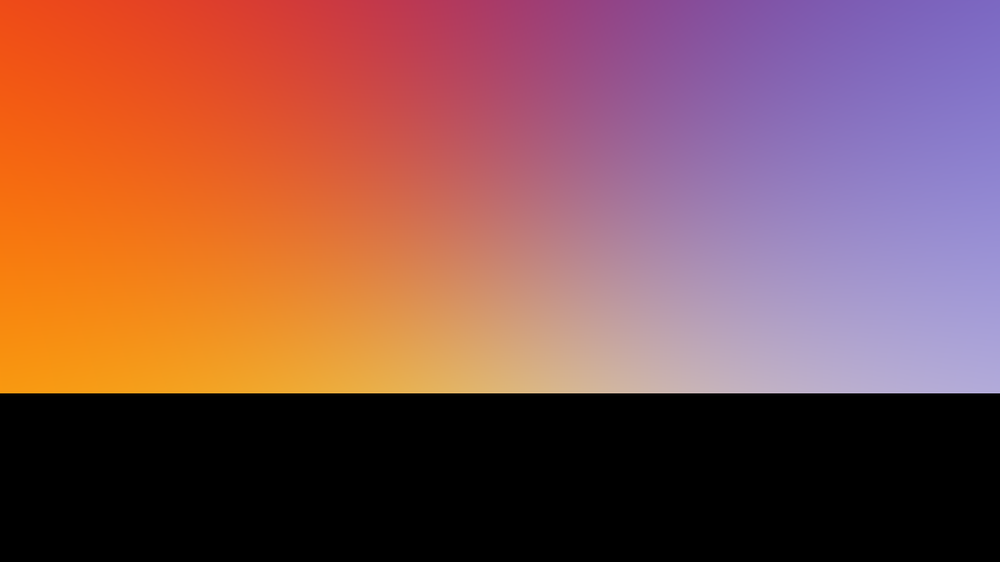

70%...

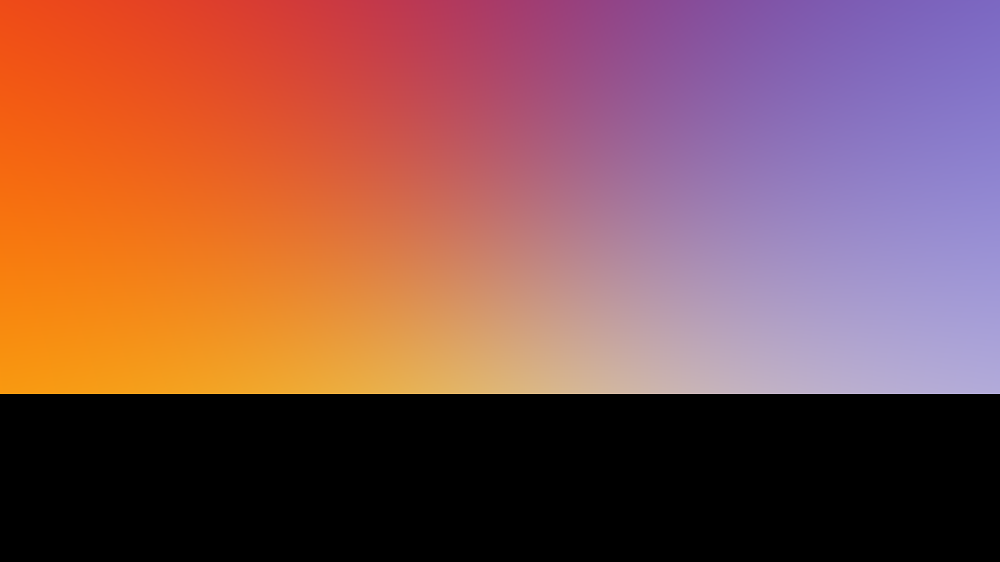

70%...

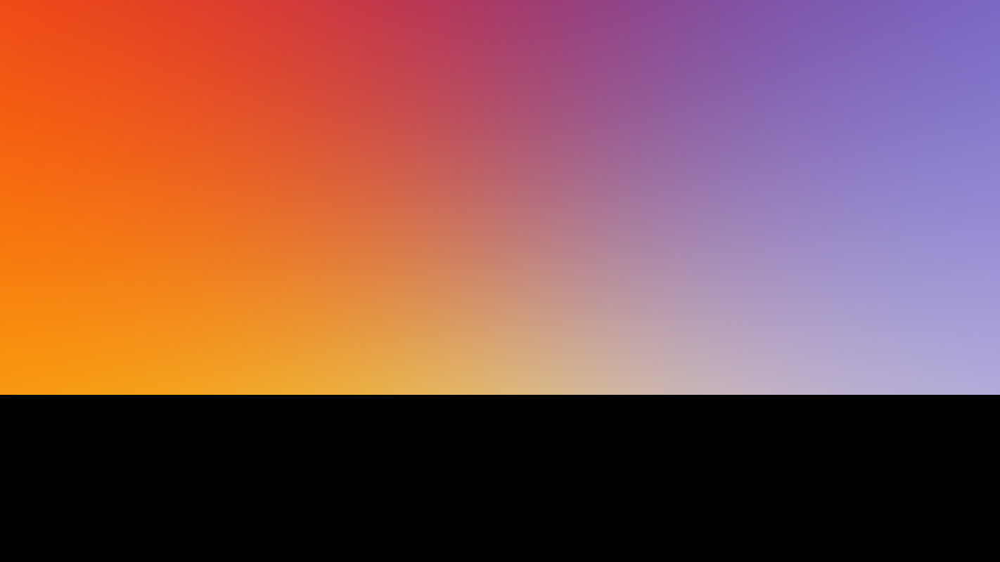

70%...

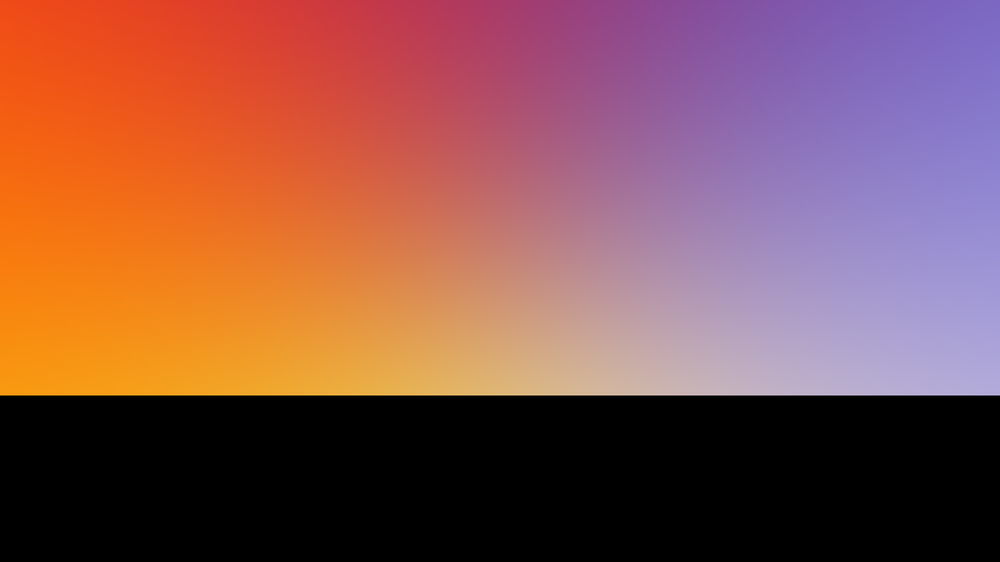

70%...

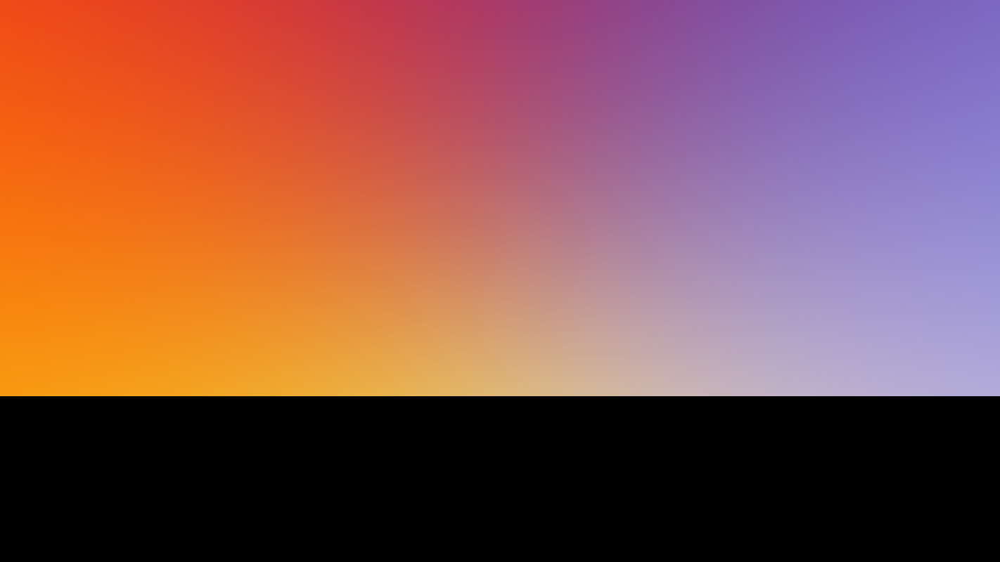

70%...

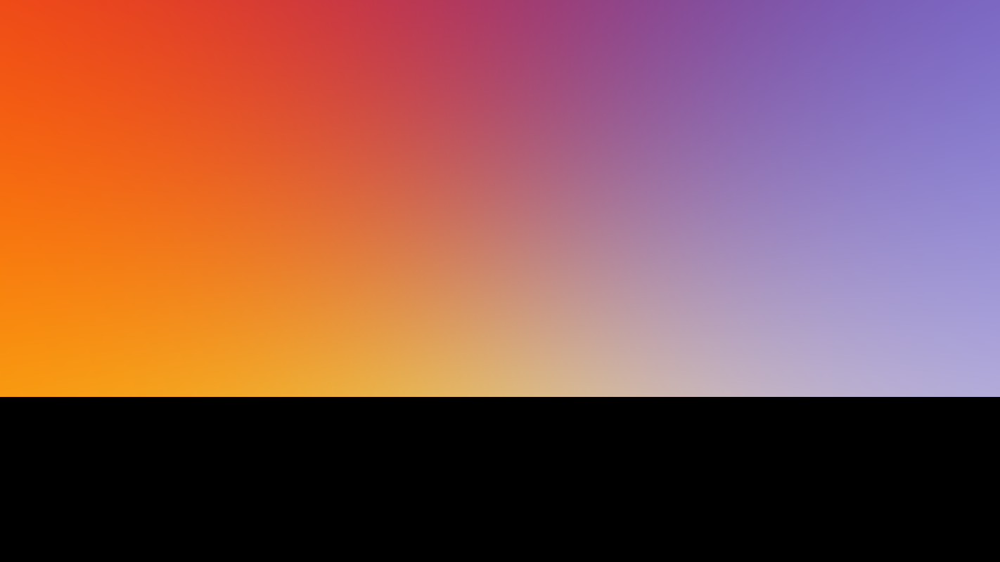

70%...

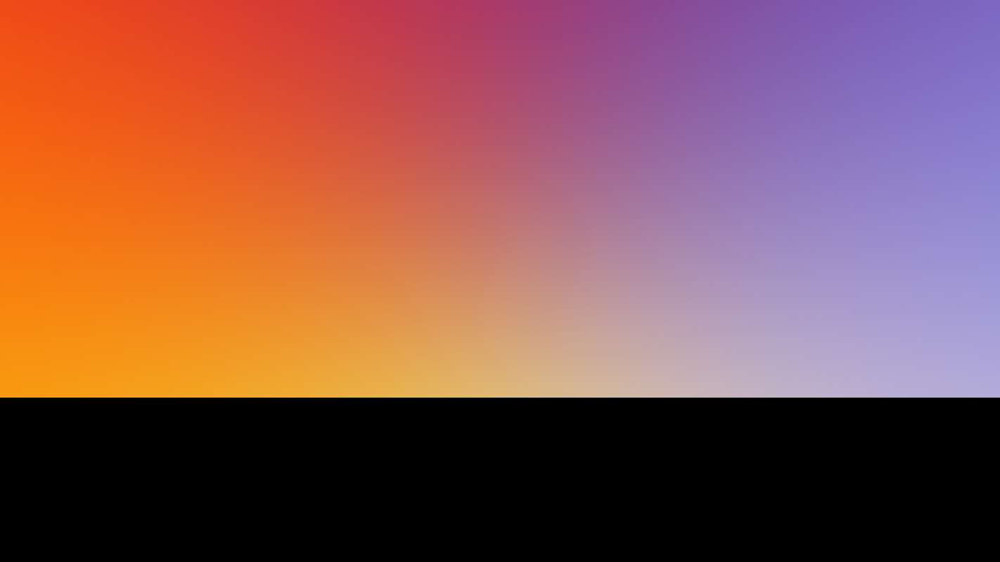

70%...

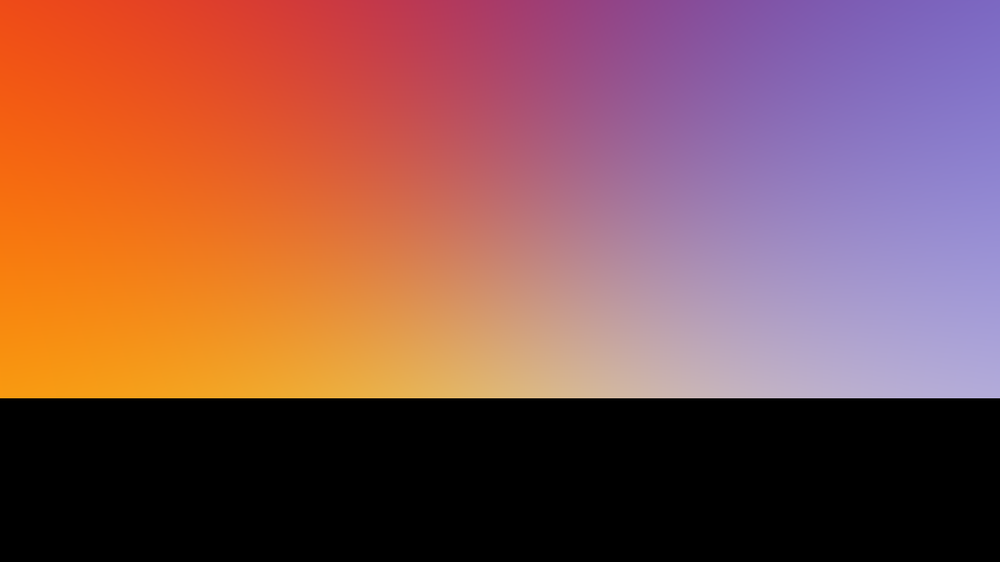

80%...

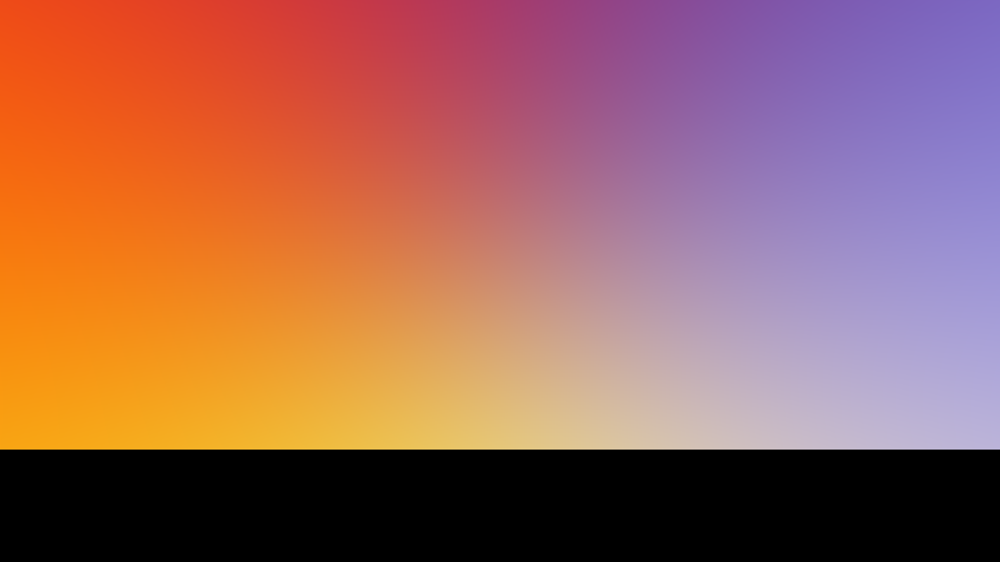

80%...

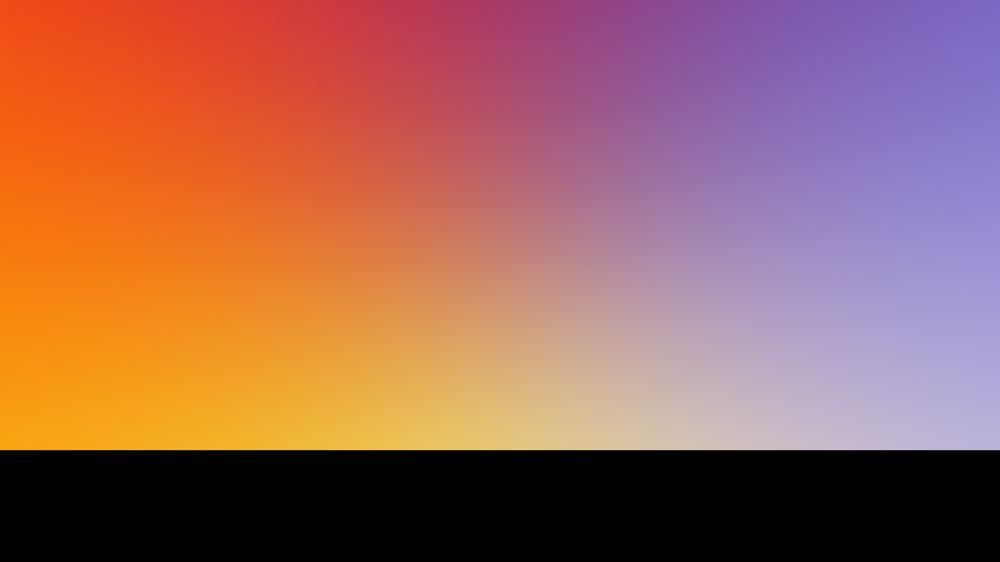

80%...

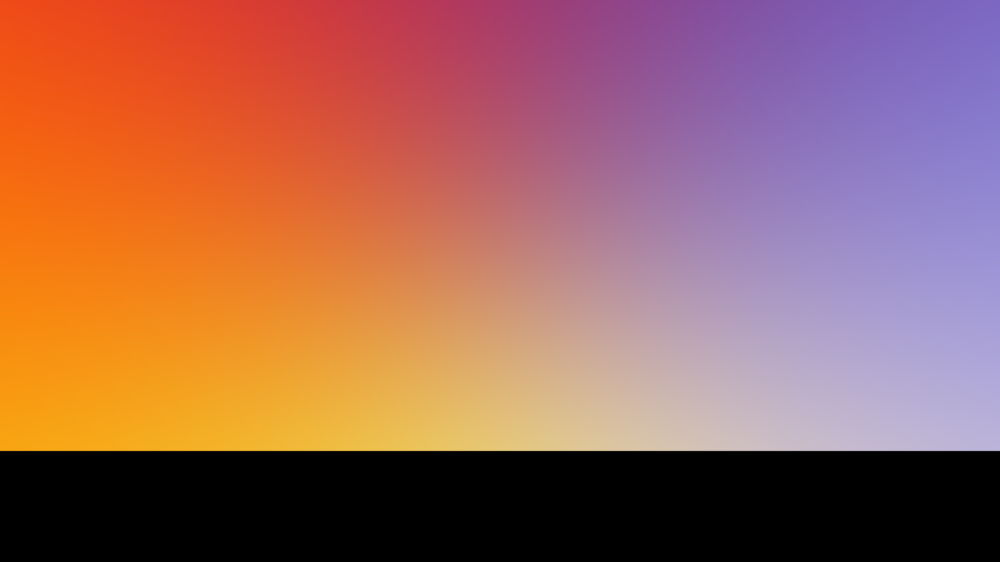

80%...

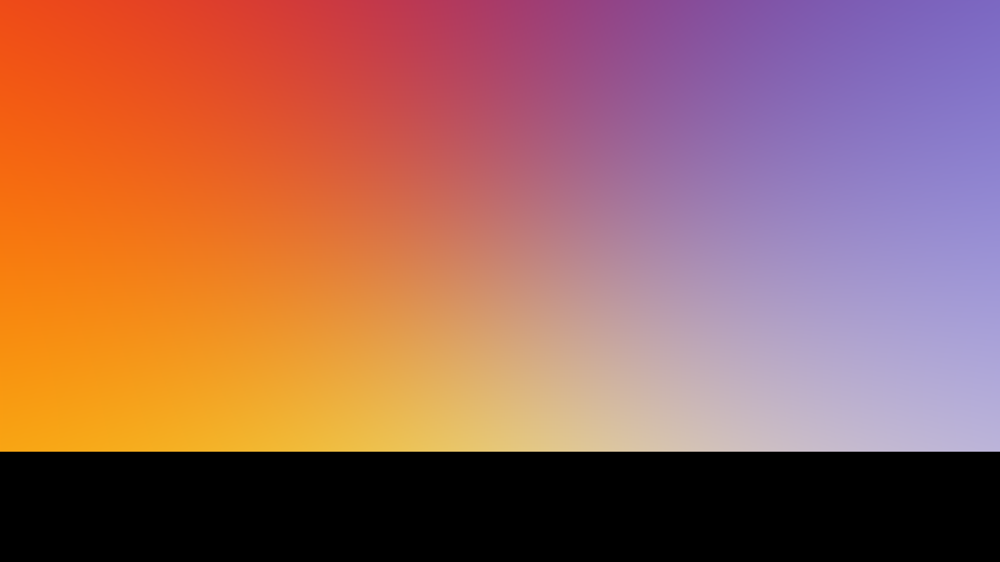

80%...

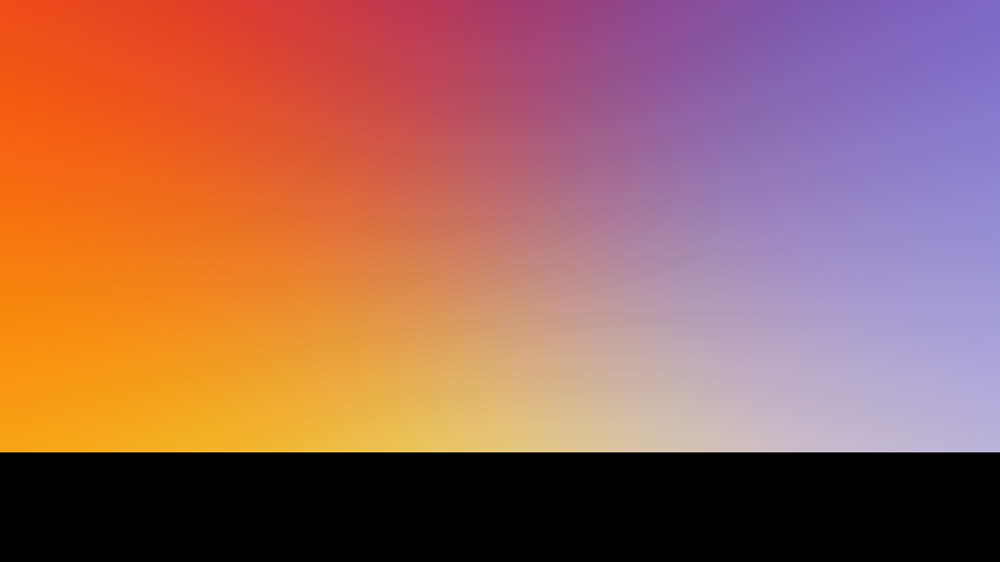

80%...

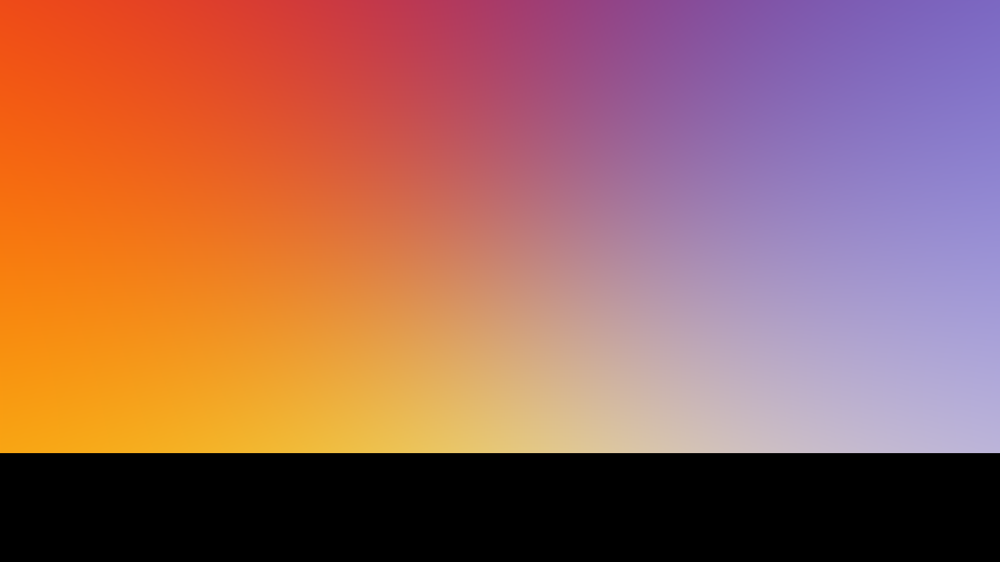

80%...

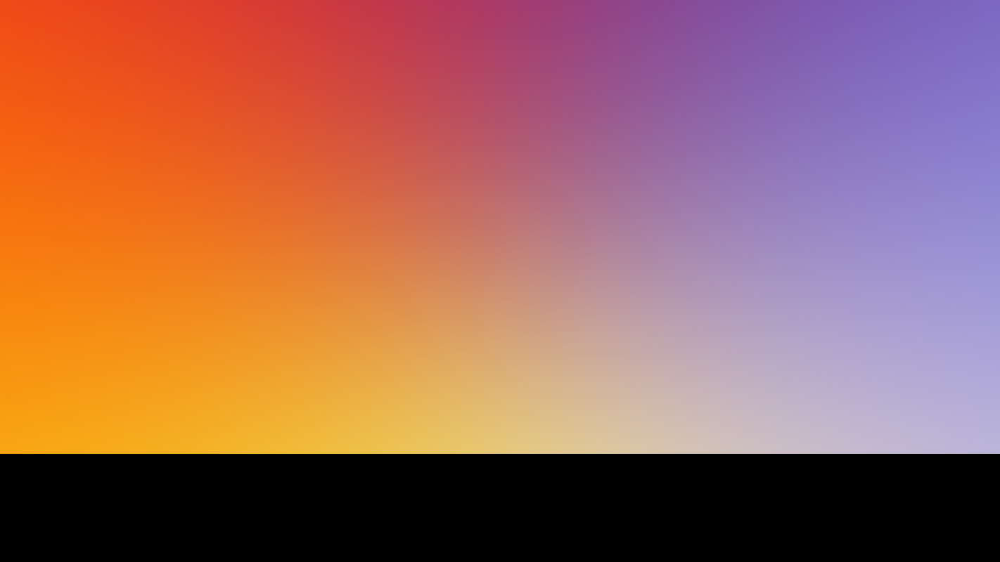

80%...

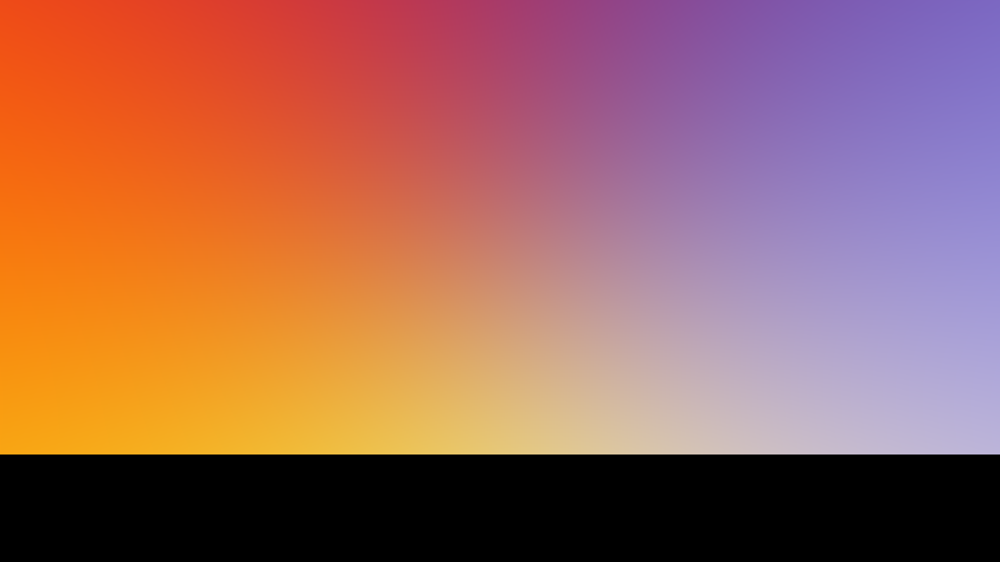

In [ ]:
#triangles
#https://www.scratchapixel.com/lessons/3d-basic-rendering/ray-tracing-rendering-a-triangle/ray-triangle-intersection-geometric-solution#:~:text=The%20ray%20can%20intersect%20the,these%20two%20vectors%20is%200).
class Triangle(Surface):
    def __init__(self,p0,p1,p2, color=vec3([1,0,0])):
        self.p0=p0
        self.p1=p1
        self.p2=p2        
        self.center=(p0+p1+p2)/3
        self.color=color

        normal=torch.cross(p1-p0,p2-p0)
        normal=unit_vector(normal)
        self.normal=normal

    def hit(self,ray, t_range=(0,float("inf"))):
        edge1 = self.p2 - self.p1
        edge2 = self.p0 - self.p2 

        #from behind, no hit
        #if dot(ray.dir,self.normal)>=0:
        #    return(Hit(),None)
        
        d=-dot(self.normal,self.p0)
        t = -(dot(self.normal,ray.origin) + d) / dot(self.normal,ray.dir) 
        p=ray.at(t)
        edge0 = self.p1 - self.p0
        p0_p= p - self.p0
        if dot(self.normal,torch.cross(edge0, p0_p))<0:
            return(Hit(),None)
        edge1 = self.p2 - self.p1
        p1_p= p - self.p1
        if dot(self.normal,torch.cross(edge1, p1_p))<0:
            return(Hit(),None)
        edge2 = self.p0 - self.p2
        p2_p= p - self.p2
        if dot(self.normal,torch.cross(edge2, p2_p))<0:
            return(Hit(),None)
        
        hitpoint=Hit(point=p, t=t, normal = self.normal)
        hitpoint.set_face_normal(ray,self.normal)
        return (hitpoint,self)
    
#and this class stores a list of surfaces. calculate the hit point of the closes to screen
class SurfaceList(Surface):
    def __init__(self,first=None):
        self.surfaces=[]
        if first is not None:
            self.surfaces=[first]
    def add(self,surface):
        self.surfaces.append(surface)
    def clear(self):
        self.surfaces=[]
    def hit(self,ray, t_range=(0,10000.0)):
        hit=Hit()
        closest_t=t_range[1]
        surf=None
        for surface in self.surfaces:
            hit_candidate,_ = surface.hit(ray,t_range)
            if not hit_candidate.no_hit():
                if hit_candidate.t<closest_t:
                    hit=hit_candidate
                    surf=surface
                    closest_t=hit.t
        return (hit,surf) 

objs=SurfaceList()
t1=Triangle(vec3([0,-3,5]),vec3([-3,0,3]),vec3([3,0,8]))
t2=Triangle(vec3([0,-3,6]),vec3([-3,0,6]),vec3([3,0,6]))

h=800
w=int(aspect_ratio*h)
image = torch.zeros(3,h,w)


def render_reflect(ray, objs, max_t=1000):
    max_iter=10
    for i in range(max_iter):        
        hit,surf=objs.hit(ray,t_range=(0.001,max_t)) #calculate the hit point and the surface hit
        if hit.no_hit(): #if hit no surface, break, cast the bg color
            break
        reflected_dir=reflect(ray.dir,hit.normal) #if hit something, define a new ray 
        ray.origin=hit.point #change the ray origin and direction
        ray.dir=reflected_dir


    return bg_color(ray)

print(f"Scene 6, add triangle ({h}x{w})")
for i in range(h):
    if int(100*i/h) % 10==0:
        print(f"{int(100*i/h)}%",end='...')
        showImg(image)     
    for j in range(w):
        u=i/h
        v=j/w
        dir = lower_left +v*X+u*Y - origin
        ray = ray=Ray(origin,dir)

        color = render_reflect(ray,objs)
        image[:,i,j]=color

showImg(image)     

In [ ]:
!pip install numpy-stl
import os
import urllib.request
urllib.request.urlretrieve('https://cdn.thingiverse.com/assets/7b/5d/e8/d1/b4/eevee_lowpoly_flowalistik_dual1.STL', 'eevee.stl')
#['google.png']
!ls

from stl import mesh
import math
import numpy

class Mesh(SurfaceList):
    def __init__(self,stl_mesh,center=vec3()):
        self.surfaces=[]
        if is_instance(stl_mesh,str)
            tp=mesh.Mesh.from_file(stl_mesh).points.copy() #tp-> triangle points        
        else:
            tp=stl_mesh.points.copy() #tp-> triangle points        
        
        for i in range(tp.shape[0]):
            p0=vec3([tp[i,0],tp[i,1],tp[i,2]])+center
            p1=vec3([tp[i,3],tp[i,4],tp[i,5]])+center
            p2=vec3([tp[i,6],tp[i,7],tp[i,8]])+center
            self.add(Triangle(p0,p1,p2))

eevee=Mesh('eevee.stl',vec3([0,230,10]))

h=80
w=int(aspect_ratio*h)
image = torch.zeros(3,h,w)

print(f"Scene 7, full triangle mesh ({h}x{w})")
for i in range(h):
    if int(100*i/h) % 10==0:
        print(f"{int(100*i/h)}%",end='...')
        showImg(image)     
    for j in range(w):
        u=i/h
        v=j/w
        dir = lower_left +v*X+u*Y - origin
        ray = ray=Ray(origin,dir)

        color = render_reflect(ray,eevee)
        image[:,i,j]=color
showImg(image)     

In [ ]:
objs=SurfaceList()
t1=Triangle(vec3([  -8.3818, -230.2798,    8.9269]),vec3([  -2.1646, -247.2241,   11.4436]),vec3([  -4.9951, -245.5898,    6.4800]))
objs.add(t1)
h=40
w=int(aspect_ratio*h)
image = torch.zeros(3,h,w)

print(f"Scene 7, full triangle mesh ({h}x{w})")
for i in range(h):
    if int(100*i/h) % 10==0:
        print(f"{int(100*i/h)}%",end='...')
        #showImg(image)     
    for j in range(w):
        u=i/h
        v=j/w
        dir = lower_left +v*X+u*Y - origin
        ray = ray=Ray(origin,dir)

        color = render_reflect(ray,objs)
        image[:,i,j]=color
showImg(image)     

In [ ]:
# Create 3 faces of a cube
data = numpy.zeros(6, dtype=mesh.Mesh.dtype)

# Top of the cube
data['vectors'][0] = numpy.array([[0, 1, 1],
                                  [1, 0, 1],
                                  [0, 0, 1]])
data['vectors'][1] = numpy.array([[1, 0, 1],
                                  [0, 1, 1],
                                  [1, 1, 1]])
# Front face
data['vectors'][2] = numpy.array([[1, 0, 0],
                                  [1, 0, 1],
                                  [1, 1, 0]])
data['vectors'][3] = numpy.array([[1, 1, 1],
                                  [1, 0, 1],
                                  [1, 1, 0]])
# Left face
data['vectors'][4] = numpy.array([[0, 0, 0],
                                  [1, 0, 0],
                                  [1, 0, 1]])
data['vectors'][5] = numpy.array([[0, 0, 0],
                                  [0, 0, 1],
                                  [1, 0, 1]])

# Since the cube faces are from 0 to 1 we can move it to the middle by
# substracting .5
data['vectors'] -= .5

# Generate 4 different meshes so we can rotate them later
meshes = [mesh.Mesh(data.copy()) for _ in range(4)]

# Rotate 90 degrees over the Y axis
meshes[0].rotate([0.0, 0.5, 0.0], math.radians(90))

# Translate 2 points over the X axis
meshes[1].x += 2

# Rotate 90 degrees over the X axis
meshes[2].rotate([0.5, 0.0, 0.0], math.radians(90))
# Translate 2 points over the X and Y points
meshes[2].x += 2
meshes[2].y += 2

# Rotate 90 degrees over the X and Y axis
meshes[3].rotate([0.5, 0.0, 0.0], math.radians(90))
meshes[3].rotate([0.0, 0.5, 0.0], math.radians(90))
# Translate 2 points over the Y axis
meshes[3].y += 2


objs=SurfaceList()
objs.add(Mesh(meshes[0],vec3([0,0,5])))
objs.add(Mesh(meshes[1],vec3([0,0,5])))
objs.add(Mesh(meshes[2],vec3([0,0,5])))
objs.add(Mesh(meshes[3],vec3([0,0,5])))

print(f"Scene 7, full triangle mesh ({h}x{w})")
for i in range(h):
    if int(100*i/h) % 10==0:
        print(f"{int(100*i/h)}%",end='...')
        #showImg(image)     
    for j in range(w):
        u=i/h
        v=j/w
        dir = lower_left +v*X+u*Y - origin
        ray = ray=Ray(origin,dir)

        color = render_reflect(ray,objs)
        image[:,i,j]=color
showImg(image)     